In [1]:
# new MA
import polars as pl
import numpy as np
import pandas as pd
from scipy import signal
import io
import matplotlib.pyplot as plt
def file_to_lazy_frame(filename):
    return pl.read_csv(filename, columns=['ts', 'z'], use_pyarrow=True).select([pl.col('ts').cast(pl.Datetime), pl.col('z').cast(pl.Int16)]).interpolate().filter(pl.col('ts').is_not_null()).filter(pl.col('z').is_not_null())

def get_filename(primary):
    return r"C:\Users\13103\Documents\data_analysis\PSG\rawdata\p5.csv"

xl0 = file_to_lazy_frame(get_filename(True))
xl1 = file_to_lazy_frame(get_filename(False))

# join data from each imu by the millisecond
xlz = xl0.groupby_dynamic('ts', every='1ms').agg(pl.mean('z')).rename({'z': 'z0'}).join(xl1.groupby_dynamic('ts', every='1ms').agg(pl.mean('z')).rename({'z': 'z1'}), on='ts', how='inner').select([pl.col('ts'), pl.col('z0').cast(pl.Int16), pl.col('z1').cast(pl.Int16)])

# convert into a pandas dataframe
df = xlz.to_pandas()
# convert into a pandas series
series = xlz.select(pl.col('z0')).to_series()

df = df.rename(columns={'z0': 'z'})
df['z'] = df['z']*2/9800
df['x'] = 0
df['y'] = 0
# df['ts'] = df ['ts']/10**6
# df.index = df['ts'].values.astype(np.int64)
df.index = pd.to_datetime(df['ts'].values.astype(np.int64))
ma_df = df

In [4]:
fs = 1e-09**-1/np.median(np.diff(df.index.values.astype(np.int64)))
fs

999.9999999999999

In [1]:
# Old MA
import polars as pl
import numpy as np
import pandas as pd
from scipy import signal
import io
import matplotlib.pyplot as plt
f = open(r'C:\Users\13103\Documents\data_analysis\PSG\MA\test02-MA127-ma_v11-imu0-2022-07-10T16_00_00-0500-2022-07-15T06_30_00-0500.csv.gz','rb') 
df = pd.read_csv(io.BytesIO(f.read()),index_col='timestamp',compression='gzip')
df.index = pd.to_datetime(df.index).values.astype(np.int64)
df = df.tail(-40000)
df = df.rename(columns={'channel0': 'x', 'channel1': 'y','channel2': 'z'})
for i in ['x','y','z']:
    df[i]= df[i]/980

In [8]:
# ECG

import polars as pl
import numpy as np
import pandas as pd
from scipy import signal
import io
import matplotlib.pyplot as plt
def file_to_lazy_frame(filename):
    return pl.read_csv(filename, columns=['ts', 'value'], use_pyarrow=True).select([pl.col('ts').cast(pl.Datetime), pl.col('value').cast(pl.Int16)]).interpolate().filter(pl.col('ts').is_not_null()).filter(pl.col('value').is_not_null())

def get_filename(primary):
    return r'C:\Users\13103\Documents\data_analysis\PSG\MA\0327\ECG.csv'

xl0 = file_to_lazy_frame(get_filename(True))
xl1 = file_to_lazy_frame(get_filename(False))

# join data from each imu by the millisecond
xlz = xl0.groupby_dynamic('ts', every='1ms').agg(pl.mean('value')).rename({'value': 'v'}).join(xl1.groupby_dynamic('ts', every='1ms').agg(pl.mean('value')).rename({'value': 'v2'}), on='ts', how='inner').select([pl.col('ts'), pl.col('v').cast(pl.Int16), pl.col('v2').cast(pl.Int16)])

# convert into a pandas dataframe
ecg_df = xlz.to_pandas()
# convert into a pandas series
series = xlz.select(pl.col('v')).to_series()

# df = df.rename(columns={'v2': 'v'})

# df['ts'] = df ['ts']/10**6
# df.index = df['ts'].values.astype(np.int64)
ecg_df.index = pd.to_datetime(ecg_df['ts'].values.astype(np.int64))
ecg_df = ecg_df['v']

In [11]:
ecg_df = ecg_df['v']

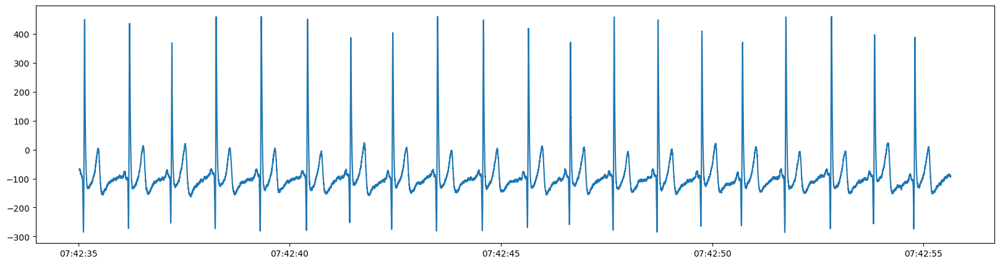

In [4]:
plt.figure(figsize=(20,5))
plt.plot(ecg_df[3990000:4010000])

In [341]:
def np_bandpass_filt(sig,cutoff,fs,mode):
    nyq = 0.5*fs
    wn = cutoff/nyq
    sos = signal.butter(4, wn, btype=mode,output='sos')
    print(sig)
    return signal.sosfiltfilt(sos,sig,axis=0)
single_peak = np_bandpass_filt(cwt_se_gs, 1/0.7, fs, 'lowpass')

peaks, _ = signal.find_peaks(single_peak,height=2e-7,distance=350)
peak_intervals = np.diff(peaks)
f_interval = cal_hrv(peak_intervals)
heart_rates = 60 / np.array(f_interval)*fs
filled_heart_rates = np.zeros(len(cwt_se_gs))
for i, p in enumerate(peaks):
    if i == 0:
        continue
    filled_heart_rates[p] = heart_rates[i-1]
# filled_heart_rates = pd.Series(filled_heart_rates).replace(0, np.nan)
# filled_heart_rates = filled_heart_rates.fillna(method='ffill')
# filled_heart_rates = filled_heart_rates.fillna(method='bfill')
# filtered_hr = np_bandpass_filt(filled_heart_rates, 0.1, 999.999, 'lowpass')



[2.18080344e-06 2.17959971e-06 2.17719543e-06 ... 1.55874965e-06
 1.55962734e-06 1.56007148e-06]
inital length
167 outlier(s) have been deleted.
The outlier(s) value(s) are : [1616, 2217, 1995, 1615, 380, 1720, 1523, 1565, 1613, 391, 1549, 1536, 1561, 1919, 397, 1611, 1782, 1713, 1733, 1733, 1762, 1699, 1607, 1602, 360, 1525, 1916, 1920, 394, 1683, 2077, 1885, 1841, 1633, 1640, 1600, 372, 393, 1781, 1936, 1802, 1657, 1591, 1971, 1567, 1545, 381, 350, 356, 372, 2051, 1508, 384, 399, 394, 350, 1527, 389, 1506, 1535, 377, 396, 1512, 398, 369, 359, 371, 1553, 354, 1583, 355, 1615, 1558, 1552, 1575, 379, 1525, 361, 393, 393, 1648, 2081, 351, 1597, 1584, 1586, 1765, 1532, 1863, 1508, 1966, 1528, 1851, 1547, 1533, 1503, 1685, 352, 1785, 365, 1501, 1532, 399, 355, 1541, 386, 370, 371, 384, 392, 386, 1507, 391, 1519, 399, 1835, 1513, 392, 1513, 1561, 351, 1538, 1588, 1514, 1511, 1505, 1559, 1599, 1577, 1505, 1580, 1535, 1526, 1607, 398, 393, 1576, 1504, 1542, 1520, 1517, 1630, 1554, 1559, 1523,

In [376]:
def np_bandpass_filt(sig,cutoff,fs,mode):
    nyq = 0.5*fs
    wn = cutoff/nyq
    sos = signal.butter(4, wn, btype=mode,output='sos')
    print(sig)
    return signal.sosfiltfilt(sos,sig,axis=0)
merged_peaks = np_bandpass_filt(cwt_se_gs, 1/0.7, fs, 'lowpass')

[2.18080344e-06 2.17959971e-06 2.17719543e-06 ... 1.55874965e-06
 1.55962734e-06 1.56007148e-06]


In [350]:
len(peaks)
len(heart_rates)

17617

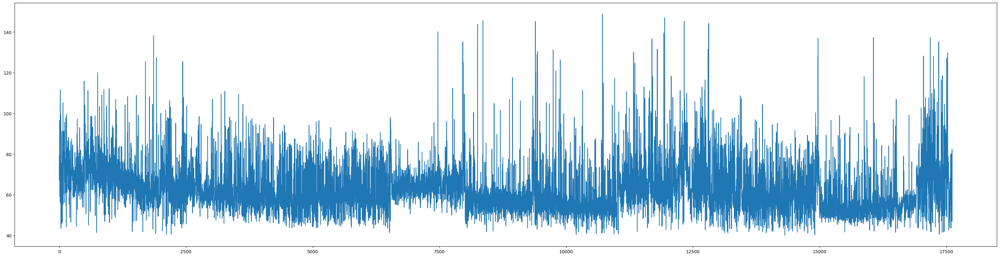

In [345]:
plt.figure(figsize=(40,10))
plt.plot(heart_rates)

In [383]:
#interval calculation with HRV feature extraction and binning

peaks, _ = signal.find_peaks(merged_peaks,height=0.2*10**-5,distance=400)
itv_1 = peaks[0]
i = 0
k = 0
hr = pd.DataFrame(columns=['index','Hr'])
ma_it = pd.DataFrame(columns=['index','Hr'])
hrv_feature = pd.DataFrame()
while i < peaks.size-2:

    interval = peaks[i+2]-itv_1
    # itv_1 = peaks[i+2]
    # i = i+2
    if interval > 1200:
        interval = peaks[i+1]-itv_1
        itv_1 = peaks[i+1]
        i = i+1
    else: 
        itv_1 = peaks[i+2]
        i = i+2

    k=k+interval
    hr_df = pd.DataFrame({'index': itv_1,'Hr':interval},index = [itv_1])
    hr = pd.concat([hr,hr_df])
    ma_it = pd.concat([ma_it,hr_df])
    if k > 120*1000:
        bined_interval = hr.Hr.values.tolist()
        filtered_interval = cal_hrv(bined_interval)
        try:
            feature = pd.DataFrame([hrv.get_frequency_domain_features(filtered_interval)])
        except:
            feature = pd.DataFrame([hrv.get_frequency_domain_features(bined_interval)])
        feature['time'] = ma_df.index[itv_1]
        hrv_feature = pd.concat([hrv_feature,feature],ignore_index=True)
        hr = pd.DataFrame(columns=['index','Hr'])
        k=0 
    

# hr.index = hr['index']
# filtered_ma_hr = hr[(hr['Hr']<1200) & (hr['Hr']>750)]
# filtered_ma_hr = fs/filtered_hr*60
# ma_it = hr[(hr['Hr']<1200) & (hr['Hr']>750)]
ma_hrv = hrv_feature.copy()
    

inital length
8 outlier(s) have been deleted.
The outlier(s) value(s) are : [1616, 2217, 1995, 1615, 1671, 1526, 1573, 1594]
32 ectopic beat(s) have been deleted with malik rule.
inital length
17 outlier(s) have been deleted.
The outlier(s) value(s) are : [1741, 1560, 1687, 6756, 1591, 1606, 1636, 2139, 1817, 1706, 7748, 1760, 1851, 1958, 1927, 3491, 2848]
17 ectopic beat(s) have been deleted with malik rule.
inital length
16 outlier(s) have been deleted.
The outlier(s) value(s) are : [1854, 3608, 1720, 1952, 1879, 2081, 1720, 2705, 1860, 1642, 14072, 4579, 2067, 1945, 1884, 2469]
16 ectopic beat(s) have been deleted with malik rule.
inital length
15 outlier(s) have been deleted.
The outlier(s) value(s) are : [2770, 1881, 2061, 2391, 1950, 1706, 1782, 1952, 1587, 2026, 6143, 2450, 1545, 2423, 1585]
23 ectopic beat(s) have been deleted with malik rule.
inital length
22 outlier(s) have been deleted.
The outlier(s) value(s) are : [1565, 1604, 1624, 3816, 1823, 1613, 2731, 2204, 1536, 1566

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 250, using nperseg = 250
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
20 outlier(s) have been deleted.
The outlier(s) value(s) are : [2862, 3036, 1847, 3016, 2031, 2100, 2915, 2965, 2908, 1981, 3883, 2195, 3845, 3757, 5812, 1917, 4837, 2026, 1810, 1956]
3 ectopic beat(s) have been deleted with malik rule.
inital length
24 outlier(s) have been deleted.
The outlier(s) value(s) are : [1838, 4839, 2258, 5872, 2486, 1809, 2082, 2103, 1861, 2273, 3366, 1979, 2202, 3008, 2194, 1796, 2889, 2021, 2067, 3816, 1772, 2233, 5366, 2219]
3 ectopic beat(s) have been deleted with malik rule.
inital length
16 outlier(s) have been deleted.
The outlier(s) value(s) are : [3796, 7134, 2005, 1957, 2229, 1663, 2915, 5245, 2318, 1714, 3945, 2917, 5477, 3139, 3887, 6631]
19 ectopic beat(s) have been deleted with malik rule.
inital length
22 outlier(s) have been deleted.
The outlier(s) value(s) are : [3273, 7450, 10468, 1525, 2228, 1916, 3591, 1779, 1503, 1636, 2850, 2323, 3175, 5788, 1917, 4433, 3851, 2022, 9980, 2954, 5023, 2922]
9 ectopic beat(s) have been deleted

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 239, using nperseg = 239
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
11 outlier(s) have been deleted.
The outlier(s) value(s) are : [1828, 1996, 1894, 1974, 1862, 1873, 1600, 1965, 1993, 2960, 1890]
15 ectopic beat(s) have been deleted with malik rule.
inital length
10 outlier(s) have been deleted.
The outlier(s) value(s) are : [1982, 1927, 1914, 3026, 2091, 1908, 1679, 3068, 1698, 2055]
21 ectopic beat(s) have been deleted with malik rule.
inital length
11 outlier(s) have been deleted.
The outlier(s) value(s) are : [2208, 1904, 1899, 2148, 1932, 1906, 2253, 1937, 2220, 1750, 1982]
22 ectopic beat(s) have been deleted with malik rule.
inital length
3 outlier(s) have been deleted.
The outlier(s) value(s) are : [1918, 2081, 2146]
27 ectopic beat(s) have been deleted with malik rule.
inital length
4 outlier(s) have been deleted.
The outlier(s) value(s) are : [2009, 2197, 1972, 1899]
32 ectopic beat(s) have been deleted with malik rule.
inital length
8 outlier(s) have been deleted.
The outlier(s) value(s) are : [2307, 2325, 1946, 1876, 2163, 2

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 236, using nperseg = 236
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 238, using nperseg = 238
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 196, using nperseg = 196
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
32 outlier(s) have been deleted.
The outlier(s) value(s) are : [2846, 1937, 1870, 2860, 2806, 1779, 2755, 2992, 2987, 2799, 2741, 1853, 3787, 5933, 1951, 1884, 2869, 1921, 3976, 2773, 1867, 3678, 2859, 1925, 1923, 1829, 1919, 2814, 2919, 2896, 2871, 2815]
0 ectopic beat(s) have been deleted with malik rule.
inital length
27 outlier(s) have been deleted.
The outlier(s) value(s) are : [2828, 3676, 3720, 1795, 7353, 1551, 8062, 4961, 1976, 1966, 1967, 2994, 2944, 1849, 3640, 3581, 2651, 4503, 3634, 2790, 1870, 1892, 2838, 7711, 3752, 4760, 6278]
0 ectopic beat(s) have been deleted with malik rule.
inital length
31 outlier(s) have been deleted.
The outlier(s) value(s) are : [3565, 1868, 1871, 3891, 4901, 2770, 1775, 1762, 2723, 3719, 2776, 1837, 3690, 1969, 7946, 9837, 2932, 2826, 3657, 3645, 1844, 1847, 2808, 3676, 1864, 2702, 2042, 3006, 1937, 3808, 5736]
1 ectopic beat(s) have been deleted with malik rule.
inital length
28 outlier(s) have been deleted.
The outlier(s) value

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 50, using nperseg = 50
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 109, using nperseg = 109
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 118, using nperseg = 118
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Package

inital length
14 outlier(s) have been deleted.
The outlier(s) value(s) are : [1740, 31174, 15818, 5240, 2086, 4175, 21794, 2278, 9539, 3246, 2149, 8638, 4157, 8458]
3 ectopic beat(s) have been deleted with malik rule.
inital length
17 outlier(s) have been deleted.
The outlier(s) value(s) are : [17780, 5974, 14128, 3218, 4223, 3175, 8350, 1892, 3139, 11702, 3329, 2041, 3338, 8587, 8508, 16035, 7492]
2 ectopic beat(s) have been deleted with malik rule.
inital length
19 outlier(s) have been deleted.
The outlier(s) value(s) are : [5472, 6657, 5324, 2201, 10701, 4215, 6368, 2125, 9000, 5125, 2212, 20461, 7573, 3978, 1979, 3181, 3230, 9725, 8658]
4 ectopic beat(s) have been deleted with malik rule.
inital length
19 outlier(s) have been deleted.
The outlier(s) value(s) are : [5196, 5264, 10760, 2184, 5300, 6671, 15076, 3364, 5421, 9708, 7554, 4432, 3205, 2220, 5487, 12948, 4184, 2153, 3250]
0 ectopic beat(s) have been deleted with malik rule.
inital length
21 outlier(s) have been deleted.
The

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 182, using nperseg = 182
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 214, using nperseg = 214
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 184, using nperseg = 184
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packa

inital length
28 outlier(s) have been deleted.
The outlier(s) value(s) are : [3413, 2176, 2246, 8024, 3322, 4539, 3280, 2088, 3480, 4433, 2264, 3407, 3430, 3492, 7556, 4390, 2084, 4340, 2246, 5550, 3362, 4486, 2248, 2248, 2275, 4506, 4576, 2249]
3 ectopic beat(s) have been deleted with malik rule.
inital length
29 outlier(s) have been deleted.
The outlier(s) value(s) are : [4580, 2244, 2213, 2191, 5827, 2177, 10403, 2277, 2030, 3428, 3396, 3269, 2188, 2287, 4610, 2244, 2277, 2188, 2170, 3335, 3395, 3319, 2386, 7034, 1525, 2204, 3219, 2248, 4478]
2 ectopic beat(s) have been deleted with malik rule.
inital length
27 outlier(s) have been deleted.
The outlier(s) value(s) are : [4627, 5719, 3444, 3438, 2446, 6841, 3349, 5829, 3305, 3362, 3453, 3335, 7882, 3431, 3435, 2292, 5660, 2211, 3394, 2256, 2289, 3370, 3284, 3349, 3411, 4491, 2214]
1 ectopic beat(s) have been deleted with malik rule.
inital length
30 outlier(s) have been deleted.
The outlier(s) value(s) are : [2232, 2166, 3283, 2273, 

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 39, using nperseg = 39
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 179, using nperseg = 179
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 194, using nperseg = 194
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
19 outlier(s) have been deleted.
The outlier(s) value(s) are : [3528, 2837, 6702, 8952, 3267, 2573, 1675, 2014, 1684, 2240, 2256, 1733, 1685, 3531, 1724, 1507, 2192, 1749, 2597]
24 ectopic beat(s) have been deleted with malik rule.
inital length
25 outlier(s) have been deleted.
The outlier(s) value(s) are : [1817, 1860, 1833, 5621, 2076, 3974, 1712, 9853, 1852, 4465, 2118, 3090, 5922, 2156, 2877, 18673, 1594, 1655, 1742, 6886, 1749, 2024, 6201, 2920, 4940]
5 ectopic beat(s) have been deleted with malik rule.
inital length
30 outlier(s) have been deleted.
The outlier(s) value(s) are : [1799, 3007, 4926, 2942, 1881, 2824, 3676, 1825, 1785, 1910, 2534, 10808, 5863, 2920, 2308, 2892, 1979, 1951, 2695, 2196, 1563, 7271, 2094, 6953, 1931, 5877, 5892, 1893, 3161, 1596]
2 ectopic beat(s) have been deleted with malik rule.
inital length
30 outlier(s) have been deleted.
The outlier(s) value(s) are : [3425, 4546, 2973, 2779, 7390, 2553, 1628, 4222, 2083, 3906, 2611, 6802, 2068, 3819

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 185, using nperseg = 185
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
32 outlier(s) have been deleted.
The outlier(s) value(s) are : [3436, 1854, 5418, 2555, 4298, 1701, 1800, 2491, 2445, 2094, 3659, 3970, 1743, 2273, 1894, 2294, 1727, 2419, 1747, 2041, 3065, 2345, 1718, 2520, 2860, 1797, 1874, 3147, 2069, 4254, 2007, 4271]
17 ectopic beat(s) have been deleted with malik rule.
inital length
27 outlier(s) have been deleted.
The outlier(s) value(s) are : [1731, 2450, 3393, 4426, 3980, 7462, 3247, 2785, 3868, 3641, 2469, 2520, 1758, 2637, 1899, 1924, 2606, 4194, 3573, 4310, 2323, 3201, 2516, 1996, 2488, 1753, 4031]
13 ectopic beat(s) have been deleted with malik rule.
inital length
27 outlier(s) have been deleted.
The outlier(s) value(s) are : [1999, 2446, 3345, 1844, 2340, 5664, 1961, 2156, 1711, 2322, 4936, 1756, 2405, 2128, 4537, 5169, 2436, 2412, 3216, 2146, 2153, 3210, 2108, 1986, 2517, 3023, 4244]
14 ectopic beat(s) have been deleted with malik rule.
inital length
24 outlier(s) have been deleted.
The outlier(s) value(s) are : [1835, 2209

134

In [299]:
a = filtered_interval[filtered_interval != 'nan']

In [294]:
b = a[0]

In [291]:
hrv.get_frequency_domain_features( [x for x in filtered_interval if x != 'nan'])

ValueError: arange: cannot compute length

In [382]:
#interval calculation with fea

#hrv calculation
import hrvanalysis as hrv
def cal_hrv(beat_interval):
    #remove outliers
    print("inital length")

    filtered_interval = hrv.remove_outliers(beat_interval,low_rri = 400,high_rri = 1500)
    #Replace na values with linear interpolation using forier transfer
    interpolated_interval = hrv.interpolate_nan_values(filtered_interval,interpolation_method="linear")
    # This remove ectopic beats from signal
    nn_intervals_list = hrv.remove_ectopic_beats(interpolated_interval, method="malik")
    # This replace ectopic beats nan values with linear interpolation
    interpolated_nn_intervals = hrv.interpolate_nan_values(nn_intervals_list)
    return interpolated_nn_intervals
# #MA data
# peaks, _ = signal.find_peaks(cwt_se_gs,height=0.2*10**-5,distance=400)

# ECG data
peaks, _ = signal.find_peaks(ecg_df,height=200,distance=350)

itv_1 = peaks[0]
i = 0
time = 0
k=0
hr = pd.DataFrame(columns=['index','Hr'])
ecg_it = pd.DataFrame(columns=['index','Hr'])
hrv_feature = pd.DataFrame()
while i < peaks.size-2:

    interval = peaks[i+1]-itv_1
    itv_1 = peaks[i+1]
    i = i+1


    hr_df = pd.DataFrame({'index': itv_1,'Hr':interval},index = [itv_1])
    hr = pd.concat([hr,hr_df])
    ecg_it = pd.concat([ecg_it,hr_df])
    time = time+interval
    k=k+interval

  

    if k > 120*1000:
        bined_interval = hr.Hr.values.tolist()
        filtered_interval = cal_hrv(bined_interval)
        hr = pd.DataFrame(columns=['index','Hr'])
        try:
            feature = pd.DataFrame([hrv.get_frequency_domain_features(filtered_interval)])
        except:
            feature = pd.DataFrame([hrv.get_frequency_domain_features(bined_interval)])
        feature['time'] = ecg_df.index[time]
        hrv_feature = pd.concat([hrv_feature,feature],ignore_index=True)
        k=0 


hr.index = hr['index']

# # hr = 1000/hr*60
# ecg_it = hr[(hr['Hr']<1200) & (hr['Hr']>750)]
ecg_hrv = hrv_feature.copy()
    

inital length
2 outlier(s) have been deleted.
The outlier(s) value(s) are : [351, 377]
2 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
4 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
1 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 224, using nperseg = 224
  warnings.warn('nperseg = {0:d} is greater than input length '
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\hrvanalysis\extra

inital length
5 outlier(s) have been deleted.
The outlier(s) value(s) are : [1695, 2304, 3105, 4991, 1382837]
2 ectopic beat(s) have been deleted with malik rule.
inital length
1 outlier(s) have been deleted.
The outlier(s) value(s) are : [1739298]
0 ectopic beat(s) have been deleted with malik rule.
inital length
4 outlier(s) have been deleted.
The outlier(s) value(s) are : [397, 1652, 3123, 1007632]
1 ectopic beat(s) have been deleted with malik rule.
inital length
6 outlier(s) have been deleted.
The outlier(s) value(s) are : [2567, 2789, 2869, 1502, 2314, 1525]
3 ectopic beat(s) have been deleted with malik rule.
inital length
4 outlier(s) have been deleted.
The outlier(s) value(s) are : [1621, 2298, 3056, 2042]
14 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 233, using nperseg = 233
  warnings.warn('nperseg = {0:d} is greater than input length '


inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
0 outlier(s) have been deleted.
0 ectopic beat(s) have been deleted with malik rule.
inital length
3 outlier(s) have been deleted.
The outlier(s) value(s) are : [2619, 1664, 452478]
2 ectopic beat(s) have been deleted with malik rule.


C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 176, using nperseg = 176
  warnings.warn('nperseg = {0:d} is greater than input length '


In [323]:
ma_hrv = hrv_feature.copy()

In [325]:
ecg_hrv = hrv_feature.copy()

In [339]:
ma_hrv

,mean_nni,sdnn,sdsd,nni_50,pnni_50,nni_20,pnni_20,rmssd,median_nni,range_nni,cvsd,cvnni,mean_hr,max_hr,min_hr,std_hr,time
time,,,,,,,,,,,,,,,,,
2023-03-26 06:36:00.696,812.402778,161.422363,122.752178,84,58.741259,110,76.923077,122.756482,802.00,799.0,0.151103,0.198697,77.104236,145.631068,49.545830,17.372347,1679812560696000000
2023-03-26 06:38:01.436,819.049296,145.600704,116.875388,74,52.482270,105,74.468085,116.879310,807.25,866.0,0.142701,0.177768,75.865442,147.058824,47.095761,15.539303,1679812681436000000
2023-03-26 06:40:01.850,872.221591,138.194943,112.315597,72,54.961832,107,81.679389,112.373130,883.50,687.0,0.128836,0.158440,70.738298,116.054159,49.833887,12.752468,1679812801850000000
2023-03-26 06:42:02.506,880.333333,167.464348,133.201184,98,71.532847,120,87.591241,133.201264,874.50,780.0,0.151308,0.190228,70.838769,127.118644,47.923323,14.723848,1679812922506000000
2023-03-26 06:44:02.525,846.325175,156.374216,122.358478,92,64.788732,113,79.577465,122.362009,825.00,761.0,0.144580,0.184768,73.518332,136.986301,50.041701,15.067236,1679813042525000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-26 11:21:20.938,991.101351,113.487824,76.081397,26,35.616438,36,49.315068,76.082823,1024.50,660.0,0.076766,0.114507,61.446969,96.308186,46.765394,8.132152,1679829680938000000
2023-03-26 11:23:24.664,NaN,NaN,NaN,19,63.333333,25,83.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1679829804664000000
2023-03-26 11:25:29.129,NaN,NaN,NaN,35,83.333333,37,88.095238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1679829929129000000


In [330]:
ecg_hrv

,mean_nni,sdnn,sdsd,nni_50,pnni_50,nni_20,pnni_20,rmssd,median_nni,range_nni,cvsd,cvnni,mean_hr,max_hr,min_hr,std_hr,time
time,,,,,,,,,,,,,,,,,
2023-03-26 06:39:10.326,790.058901,79.336594,37.866317,57,14.960630,194,50.918635,37.866477,775.5,538.000000,0.047929,0.100419,76.695787,94.786730,51.238258,7.561561,2023-03-26 06:39:10.326
2023-03-26 06:44:20.427,797.304521,73.725878,37.046881,53,14.133333,194,51.733333,37.046979,806.0,471.000000,0.046465,0.092469,75.956506,117.878193,61.224490,7.717199,2023-03-26 06:44:20.427
2023-03-26 06:49:30.335,822.924658,61.636144,31.813339,39,10.714286,193,53.021978,31.816848,824.0,316.000000,0.038663,0.074899,73.329763,90.497738,61.287028,5.628512,2023-03-26 06:49:30.335
2023-03-26 06:54:39.756,854.769231,69.864283,31.228503,42,12.000000,177,50.571429,31.238895,875.0,312.000000,0.036547,0.081735,70.710434,89.820359,61.224490,6.347303,2023-03-26 06:54:39.756
2023-03-26 06:59:50.053,931.538700,47.527314,30.913520,35,10.869565,164,50.931677,30.915583,932.0,245.000000,0.033188,0.051020,64.579272,74.719801,57.251908,3.338099,2023-03-26 06:59:50.053
2023-03-26 07:04:59.686,941.159875,64.366649,34.315929,54,16.981132,176,55.345912,34.317148,944.0,368.000000,0.036463,0.068391,64.069181,85.470085,56.074766,4.695134,2023-03-26 07:04:59.686
2023-03-26 07:10:10.002,934.848438,68.211912,42.201076,78,24.451411,201,63.009404,42.201803,941.0,323.000000,0.045143,0.072966,64.548994,81.855389,56.818182,5.070524,2023-03-26 07:10:10.002
2023-03-26 07:15:20.247,940.034375,42.676395,42.448641,77,24.137931,227,71.159875,42.448752,941.0,239.000000,0.045157,0.045399,63.958656,72.028812,55.970149,2.898874,2023-03-26 07:15:20.247
2023-03-26 07:20:30.348,949.753205,54.416874,36.431779,57,18.327974,177,56.913183,36.432954,960.0,250.000000,0.038360,0.057296,63.390788,74.812968,57.034221,3.793277,2023-03-26 07:20:30.348


In [384]:
ma_hrv.index = pd.to_datetime(ma_hrv['time'])

In [385]:
ecg_hrv.index = pd.to_datetime(ecg_hrv['time'])

Text(0, 0.5, 'ECG_lfhf')

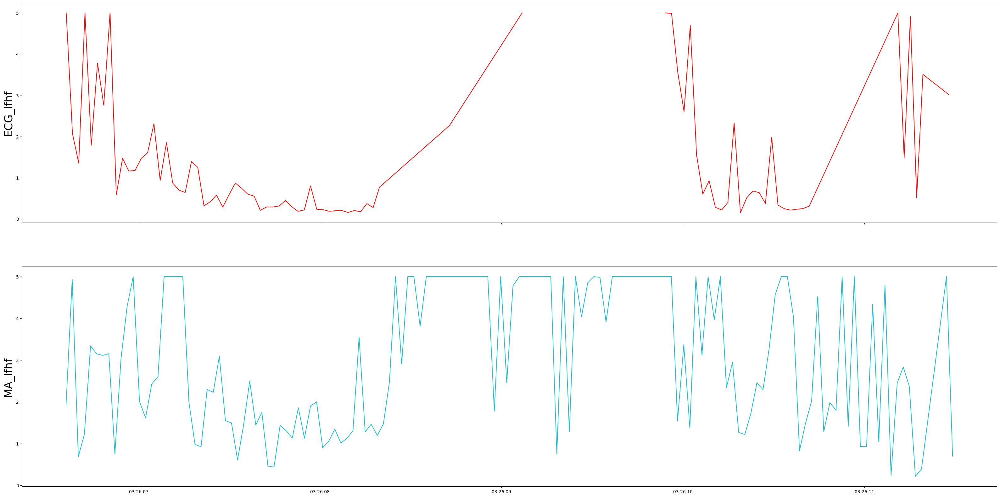

In [388]:
fig, axs = plt.subplots(2,sharex=True,figsize=(40,20))
# pt = vt[1500:2500]
axs[1].plot(ma_hrv.index,ma_hrv['lf_hf_ratio'].clip(0,5),c = 'tab:cyan')
axs[1].set_ylabel('MA_lfhf',fontsize=25)
axs[0].plot(ecg_hrv.index,ecg_hrv['lf_hf_ratio'].clip(0,5),c = 'r')
axs[0].set_ylabel('ECG_lfhf',fontsize=25)
# axs[2].plot( pd.to_datetime(filtered_vt.index),filtered_vt['HR_MA'],c ='0.5')
# axs[2].set_ylabel('MA_old_method_HR',fontsize=25)

In [278]:
ma_hrv = hrv_feature.copy()

In [274]:
ecg_hrv = hrv_feature.copy()

In [275]:
ecg_hrv

,lf,hf,lf_hf_ratio,lfnu,hfnu,total_power,vlf,time
0,1231.933217,83.156868,14.814570,93.676717,6.323283,1810.062414,494.972329,2023-03-26 06:36:03.974
1,289.190178,139.657343,2.070712,67.434266,32.565734,3883.339310,3454.491789,2023-03-26 06:38:07.759
2,321.851995,238.207360,1.351142,57.467479,42.532521,859.503877,299.444522,2023-03-26 06:40:12.081
3,1092.879366,211.945654,5.156413,83.756776,16.243224,5135.535585,3830.710566,2023-03-26 06:42:15.880
4,1520.478259,851.534771,1.785574,64.100755,35.899245,3432.987553,1060.974524,2023-03-26 06:44:20.427
5,1333.038546,352.523905,3.781413,79.085681,20.914319,1963.371686,277.809235,2023-03-26 06:46:24.613
6,464.899121,168.549813,2.758230,73.391728,26.608272,2018.843775,1385.394841,2023-03-26 06:48:28.820
7,1155.501650,164.992412,7.003362,87.505252,12.494748,2670.594155,1350.100093,2023-03-26 06:50:33.301
8,343.469725,587.338424,0.584790,36.900163,63.099837,1238.929583,308.121434,2023-03-26 06:52:37.298
9,400.732694,272.715528,1.469416,59.504604,40.495396,780.112871,106.664650,2023-03-26 06:54:41.583


In [265]:
hrv.get_frequency_domain_features(filtered_interval)

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\hrvanalysis\extract_features.py:434: RuntimeWarning: invalid value encountered in scalar divide
  lf_hf_ratio = lf / hf
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\hrvanalysis\extract_features.py:435: RuntimeWarning: invalid value encountered i

{'lf': 0.0,
 'hf': 0.0,
 'lf_hf_ratio': nan,
 'lfnu': nan,
 'hfnu': nan,
 'total_power': 0.0,
 'vlf': 0.0}

In [264]:
hrv_feature

,lf,hf,lf_hf_ratio,lfnu,hfnu,total_power,vlf,time
0,702.151521,166.590283,4.214841,80.823959,19.176041,2007.606895,1138.865091,2023-03-26 06:39:10.326
1,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:39:11.138
2,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:39:11.954
3,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:39:12.773
4,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:39:13.618
...,...,...,...,...,...,...,...,...
614,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:47:44.867
615,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:47:45.788
616,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:47:46.690
617,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,2023-03-26 06:47:47.628


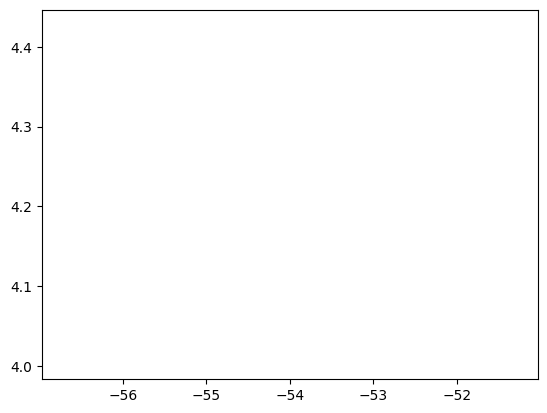

In [252]:
plt.plot(hrv_feature['time'],hrv_feature['lf_hf_ratio'])

In [241]:
fq = cal_hrv(hr.Hr.values.tolist())

inital length
2 outlier(s) have been deleted.
The outlier(s) value(s) are : [351, 377]
2 ectopic beat(s) have been deleted with malik rule.


In [233]:
freq_fea

[nan]

In [229]:
freq_fea

[nan]

In [239]:
#hrv calculation
import hrvanalysis as hrv
def cal_hrv(beat_interval):
    #remove outliers
    print("inital length")

    filtered_interval = hrv.remove_outliers(beat_interval,low_rri = 400,high_rri = 1500)
    #Replace na values with linear interpolation using forier transfer
    interpolated_interval = hrv.interpolate_nan_values(filtered_interval,interpolation_method="linear")
    # This remove ectopic beats from signal
    nn_intervals_list = hrv.remove_ectopic_beats(interpolated_interval, method="malik")
    # This replace ectopic beats nan values with linear interpolation
    interpolated_nn_intervals = hrv.interpolate_nan_values(nn_intervals_list)
    return interpolated_nn_intervals

In [223]:
ecg_ls = ecg_it['Hr'].values.tolist()

In [242]:
ecg_feq_fea = hrv.get_frequency_domain_features(fq)

In [248]:
test = pd.DataFrame([ecg_feq_fea])

In [250]:
ecg_feq_fea['time'] = tm

In [243]:
ecg_feq_fea

{'lf': 702.1515208739963,
 'hf': 166.59028292293024,
 'lf_hf_ratio': 4.214840797160019,
 'lfnu': 80.82395917926016,
 'hfnu': 19.17604082073984,
 'total_power': 2007.6068949371013,
 'vlf': 1138.8650911401746}

In [11]:
peaks[i+1]

1708

In [20]:
tm = pd.to_datetime(ecg_df.index)

In [ ]:
ecg_hr = hr[(hr['Hr']<1200) & (hr['Hr']>750)]

In [21]:
ecg_df.index[1]

Timestamp('2023-03-26 06:34:00.148000')

In [178]:
hr_e.index


DatetimeIndex(['2023-03-26 06:34:01.136000', '2023-03-26 06:34:02.739000',
               '2023-03-26 06:34:03.603000', '2023-03-26 06:34:04.462000',
               '2023-03-26 06:34:06.175000', '2023-03-26 06:34:07.448000',
               '2023-03-26 06:34:08.677000', '2023-03-26 06:34:09.461000',
               '2023-03-26 06:34:10.244000', '2023-03-26 06:34:11.030000',
               ...
               '2023-03-26 11:29:29.521000', '2023-03-26 11:29:30.685000',
               '2023-03-26 11:29:31.796000', '2023-03-26 11:29:32.967000',
               '2023-03-26 11:29:34.135000', '2023-03-26 11:29:35.215000',
               '2023-03-26 11:29:36.312000', '2023-03-26 11:29:37.438000',
               '2023-03-26 11:29:38.537000', '2023-03-26 11:29:39.560000'],
              dtype='datetime64[ns]', length=9446, freq=None)

In [218]:
hr_e = ecg_it
hr_e.index = ecg_df.index[hr_e.index]
hr_ma = ma_it
hr_ma.index = ma_df.index[hr_ma.index]
# hr_ma.Hr = fs/hr_ma.Hr*60
# hr_e.Hr = fs/hr_e.Hr*60

In [219]:
from hrvanalysis import get_frequency_domain_features

In [220]:
feq_feat = get_frequency_domain_features(hr_e)

UFuncTypeError: ufunc 'add' did not contain a loop with signature matching types (dtype('<U5'), dtype('<U5')) -> None

In [118]:
hr_ma = fs/hr_ma*60
hr_e = fs/hr_e*60

In [186]:
hr_ma.index = pd.to_datetime(hr_ma.index)

In [121]:
hr_e.index = pd.to_datetime(hr_e.index)

In [122]:
hr_ma = hr_ma.resample('1s').mean().dropna()
hr_e = hr_e.resample('1s').mean().dropna()

In [38]:
vitals = pd.DataFrame(columns=['hrm','hre','hra'])

In [86]:
filtered_vt.index = pd.to_datetime(filtered_vt.index)

In [87]:
hr_a = filtered_vt['HR_MA'].resample('5s').mean().dropna()

In [126]:
hr_a = hr_a.to_frame()

In [127]:
hr_e = hr_e.to_frame()

In [128]:
hr_ma = hr_ma.to_frame()

In [133]:
mma = hr_ma

In [134]:
vt = mma.join(hr_a)

In [139]:
vt = vt.join(hr_e,rsuffix='ecg')

Text(0, 0.5, 'MA_old_method_HR')

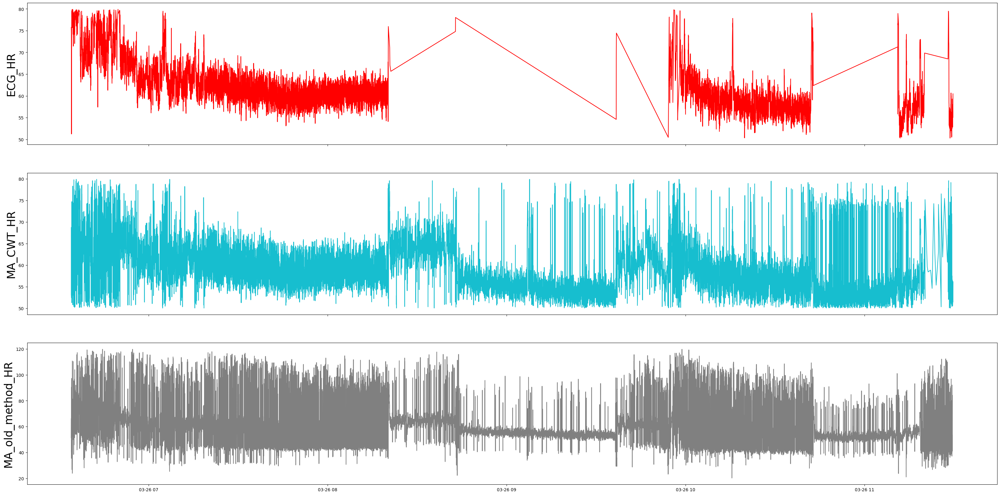

In [214]:
fig, axs = plt.subplots(3,sharex=True,figsize=(40,20))
# pt = vt[1500:2500]
axs[1].plot(hr_ma.index,hr_ma.Hr,c = 'tab:cyan')
axs[1].set_ylabel('MA_CWT_HR',fontsize=25)
axs[0].plot(hr_e.index,hr_e.Hr,c = 'r')
axs[0].set_ylabel('ECG_HR',fontsize=25)
axs[2].plot( pd.to_datetime(filtered_vt.index),filtered_vt['HR_MA'],c ='0.5')
axs[2].set_ylabel('MA_old_method_HR',fontsize=25, )




TypeError: 'AxesSubplot' object is not subscriptable

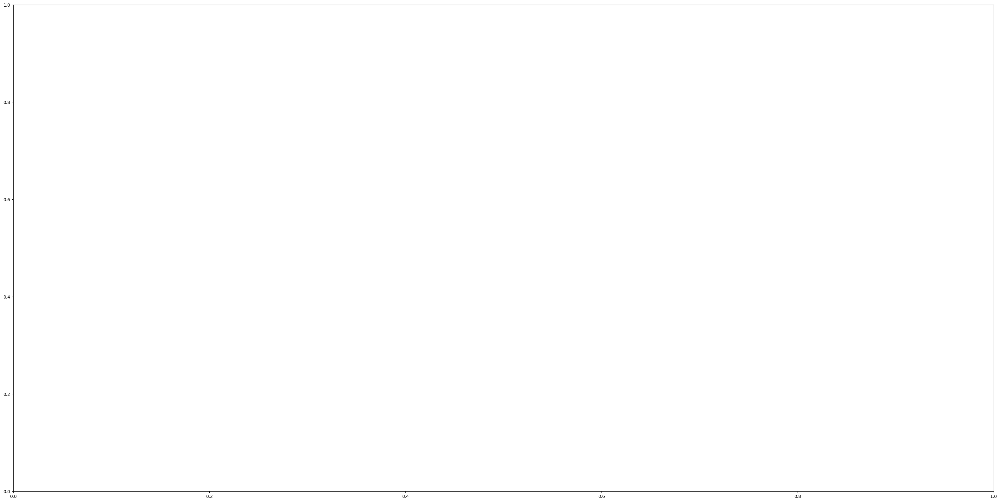

In [203]:
fig, axs = plt.subplots(1,sharex=True,figsize=(40,20))
# pt = vt[1500:2500]
axs[0].plot(hr_ma.index,hr_ma.Hr,c = 'tab:cyan')
axs[0].set_ylabel('CWT&ECG',fontsize=25)
axs[0].plot(hr_e.index,hr_e.Hr,c = 'r')
axs[1].plot()


In [367]:
f_hr = np_bandpass_filt(heart_rates,50,fs,'lowpass')

[67.18924972 79.26023778 69.12442396 ... 59.82053838 46.98512138
 46.98512138]


In [356]:
heart_rates

array([67.18924972, 79.26023778, 69.12442396, ..., 59.82053838,
       46.98512138, 46.98512138])

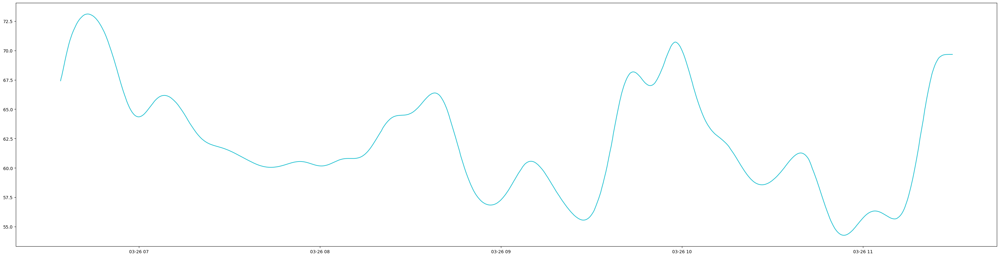

In [360]:
plt.figure(figsize=(40,10))
plt.plot(pd.to_datetime(ma_df.index[peaks[:-1]]),f_hr,c = 'tab:cyan')

Text(0.5, 1.0, 'ECG(red)vs MA_cwt(cyan)')

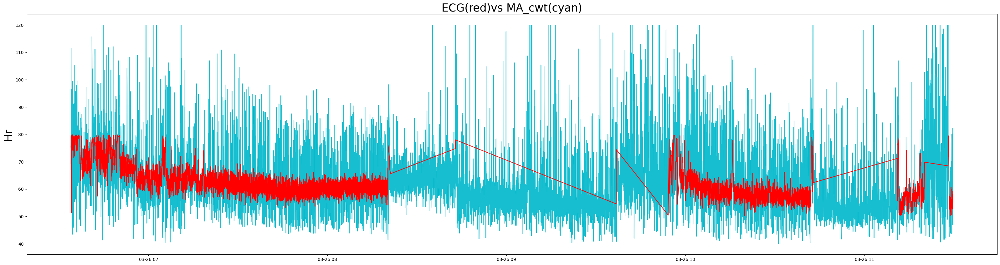

In [371]:
plt.figure(figsize=(40,10))
plt.plot(pd.to_datetime(ma_df.index[peaks[:-1]]),heart_rates.clip(40,120),c = 'tab:cyan')
plt.plot(hr_e.index,1000*60/hr_e.Hr,c = 'r')


plt.ylabel('Hr',fontsize=25)
plt.title('ECG(red)vs MA_cwt(cyan)',fontsize=25)


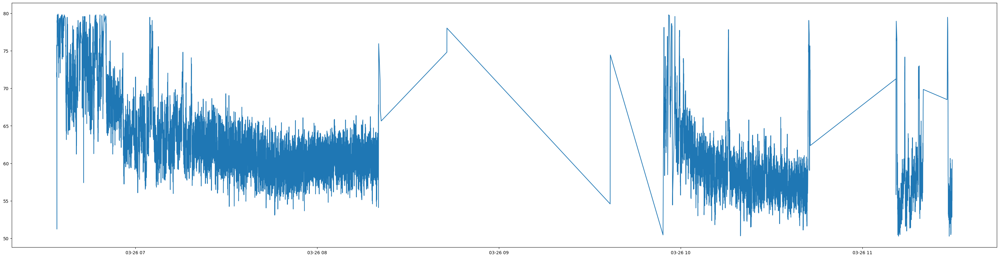

In [20]:
filtered_hr = hr[(hr['Hr']<1200) & (hr['Hr']>750)]

plt.figure(figsize=(40,10))
tm = pd.to_datetime(ecg_df.index)
plt.plot(tm[filtered_hr.index],1000/filtered_hr['Hr']*60)

In [3]:
import numpy as np
import pandas as pd
from scipy import signal
import io
from scipy import ndimage

import matplotlib.pyplot as plt

import multiprocessing as mp
from multiprocessing.shared_memory import SharedMemory
from tqdm import tqdm
import gc

import my_utils.common_utility_functions as cuf
import my_utils.ecg_functions as ecgfun
import my_utils.ma_functions as mafun
import my_utils.mwppg_functions as mwfun
import my_utils.plot_formatting as pf
params = cuf.load_defaults()
params['fs'] = 1000

In [2]:
plt.plot(df['z'][200000:202000])

NameError: name 'plt' is not defined

In [4]:
df.index = pd.to_datetime(df['ts'].values.astype(np.int64))

In [55]:
fs = 1e-09**-1/np.median(np.diff(csv.index.values.astype(np.int64)))

In [4]:
df.to_csv('yiqi.csv')

KeyboardInterrupt: 

In [3]:
import matplotlib.pyplot as plt
plt.plot(csv[1600000:2000000])

NameError: name 'csv' is not defined

In [5]:
csv = df['z']

In [151]:
csv = csv.iloc[13090717:13100717]

In [14]:
csv.to_csv('yiqi.csv')

In [52]:
csv.index = csv.index.values.astype(np.int64)

In [132]:
params['units']

1e-09

In [30]:
def bandpass_filt(sig,cutoff,fs,mode):
    nyq = 0.5*fs
    wn = cutoff/nyq
    sos = signal.butter(4, wn, btype=mode,output='sos')
    return pd.DataFrame(data=signal.sosfiltfilt(sos,sig,axis=0),columns=sig.columns,index=sig.index)

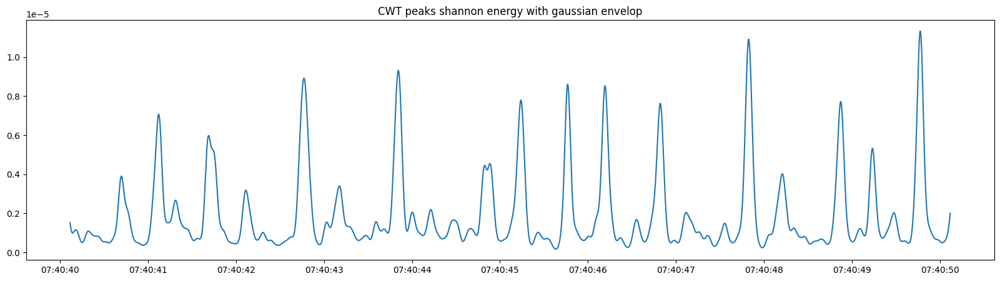

In [15]:
#CWT
from scipy import ndimage

def shannon_energy(x):
    x_env = -x**2 * np.log(x**2)
    return(x_env)

def bandpass_filt(sig,cutoff,fs,mode):
    nyq = 0.5*fs
    wn = cutoff/nyq
    sos = signal.butter(4, wn, btype=mode,output='sos')
    return pd.DataFrame(data=signal.sosfiltfilt(sos,sig,axis=0),columns=sig.columns,index=sig.index)

##generate cwt matrix

#detrending using fod
csv = ma_df['z']
csv = csv.to_frame()
csv.index = csv.index.values.astype(np.int64)
fs = 1e-09**-1/np.median(np.diff(csv.index.values.astype(np.int64)))
# csv = csv['z'].diff().to_frame()
# csv = pd.DataFrame(csv)

test_bp = bandpass_filt(csv,(20,51),fs,'bandpass')
test_bp = test_bp.to_numpy().flatten()
cwtmtx = signal.cwt(test_bp,signal.morlet,np.arange(1,100))
tm = pd.to_datetime(csv.index)

## find cwt local maxiums 
cwt_pk = cwtmtx.T[:,1:15]
cwt_pks = cwt_pk.max(axis=1)


#use shannon energy to process oscaliating signal
cwt_se = shannon_energy(cwt_pks)
cwt_se_gs = ndimage.gaussian_filter(np.abs(cwt_se),sigma=30)#40 is taken from the average heart sound lobe of 100ms 0.1*fs/4
plt.figure(figsize=(20,5))
plt.title('CWT peaks shannon energy with gaussian envelop')
plt.plot(tm[4000000:4010000],cwt_se_gs[4000000:4010000])





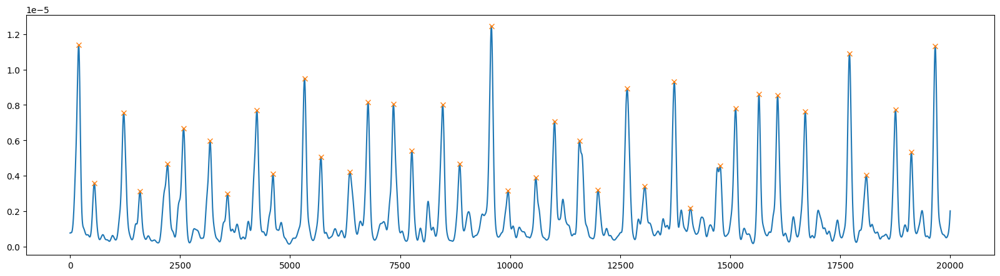

In [4]:
peaks, _ = signal.find_peaks(cwt_se_gs[3990000:4010000],height=0.2*10**-5,distance=350)
np.diff(peaks)
plt.figure(figsize=(20,5))
plt.plot(cwt_se_gs[3990000:4010000])
plt.plot(peaks, cwt_se_gs[3990000:4010000][peaks], "x")
plt.show()

In [217]:
#interval calculation
merged_peaks
peaks, _ = signal.find_peaks(cwt_se_gs,height=0.2*10**-5,distance=350)
itv_1 = peaks[0]
i = 0
hr = pd.DataFrame(columns=['index','Hr'])
while i < peaks.size-2:

    interval = peaks[i+2]-itv_1
    # itv_1 = peaks[i+2]
    # i = i+2
    if interval > 1200:
        interval = peaks[i+1]-itv_1
        if interval > 1200:
            interval = np.nan
        itv_1 = peaks[i+1]
        i = i+1
    else: 
        itv_1 = peaks[i+2]
        i = i+2
    

    hr_df = pd.DataFrame({'index': itv_1,'Hr':interval},index = [itv_1])
    hr = pd.concat([hr,hr_df])

hr.index = hr['index']
filtered_ma_hr = hr[(hr['Hr']<1200) & (hr['Hr']>750)]
filtered_ma_hr = fs/filtered_hr*60
ma_it = hr[(hr['Hr']<1200) & (hr['Hr']>750)]
    

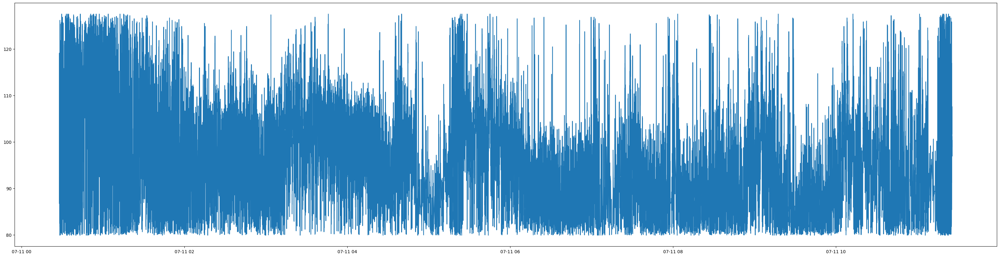

In [4]:
plt.figure(figsize=(40,10))
tm = pd.to_datetime(csv.index)
plt.plot(tm[filtered_hr.index],filtered_hr['Hr'])

In [19]:
plt.plot(ecg_df-ma_df)

MemoryError: Unable to allocate 2.17 PiB for an array with shape (17202472, 17740854) and data type float64

In [ ]:
ecg_hr

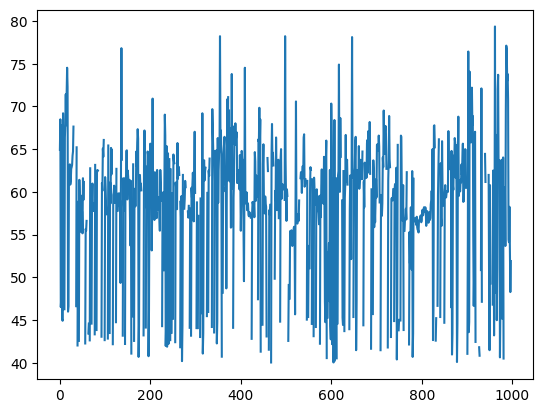

In [124]:
plt.plot(hr[2000:3000])

In [ ]:
np.resample()

In [71]:
hb,hs = get_periodic_beats(test,params)

[]


ValueError: need at least one array to concatenate

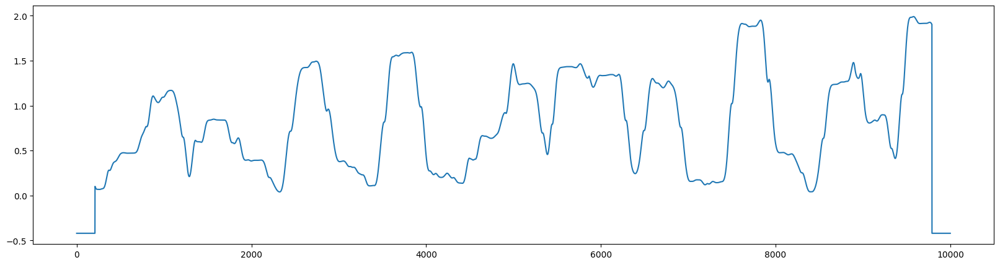

In [52]:
#peak merging
test1 = lengthtransform(test*100000)
plt.figure(figsize=(20,5))
plt.plot(test1)

In [51]:
def lengthtransform(x,w=.42,fs=999):
    #LENGTHTRANSFORM Computes the length transform of signal <sig>
    # Length transform as described in Zong, Moody, Jiang (2003) A Robust
    # Open-source Algorithm to Detect Onset and Duration of QRS Complexes.
    # Length transform is simply the curve length with different windows <w>
    # resulting in output LT as a function of window length and sample
    C = 1/(fs**2)
    w_N = int(np.ceil(w*fs))
    normfactor = w_N/fs
    dy_k = np.array(np.diff(x,prepend=0))
    dL = np.sqrt(C + dy_k**2)
    
    LTcumsum = dL.cumsum()
    LT = np.zeros(len(dL))
    LT[int(np.ceil(w_N/2)):-int(w_N/2)] = LTcumsum[w_N:] - LTcumsum[:-w_N]
    return(LT-normfactor)

In [3]:
test = cwt_se_gs[4000000:4010000]


In [ ]:
cwtmtx = signal.cwt(test.to_numpy().flatten(),signal.morlet,np.arange(1,100))
tm = pd.to_datetime(csv.index)

## find cwt local maxiums 
cwt_pk = cwtmtx.T[:,1:15]
cwt_pks = cwt_pk.max(axis=1)


#use shannon energy to process oscaliating signal
cwt_se = shannon_energy(cwt_pks)
cwt_se_gs = ndimage.gaussian_filter(np.abs(cwt_se),sigma=30)#40 is taken from the average heart sound lobe of 100ms 0.1*fs/4
plt.figure(figsize=(20,5))
plt.title('CWT peaks shannon energy with gaussian envelop')
plt.plot(tm[4000000:4010000],cwt_se_gs)

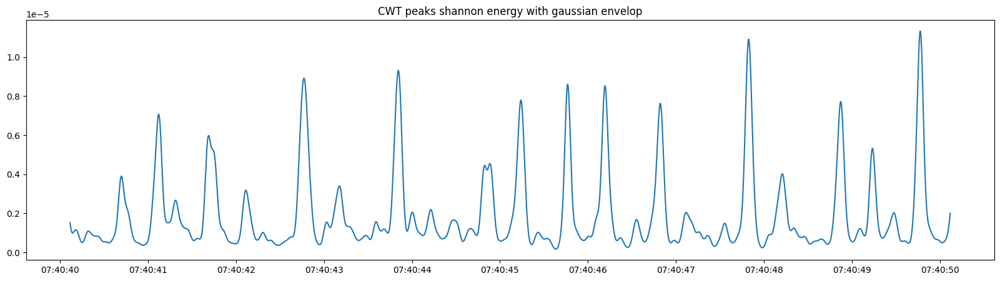

In [43]:
cwt_se = shannon_energy(cwt_pks)
cwt_se_gs = ndimage.gaussian_filter(np.abs(cwt_se),sigma=30)#40 is taken from the average heart sound lobe of 100ms 0.1*fs/4
plt.figure(figsize=(20,5))
plt.title('CWT peaks shannon energy with gaussian envelop')
plt.plot(tm[4000000:4010000],cwt_se_gs[4000000:4010000])

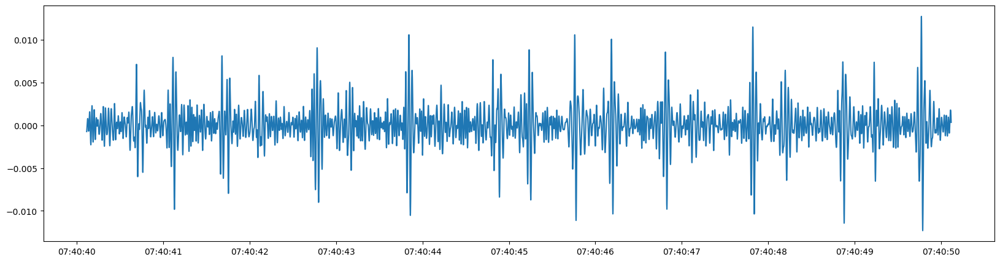

In [46]:
plt.figure(figsize=(20,5))
plt.plot(tm[4000000:4010000],csv[4000000:4010000])

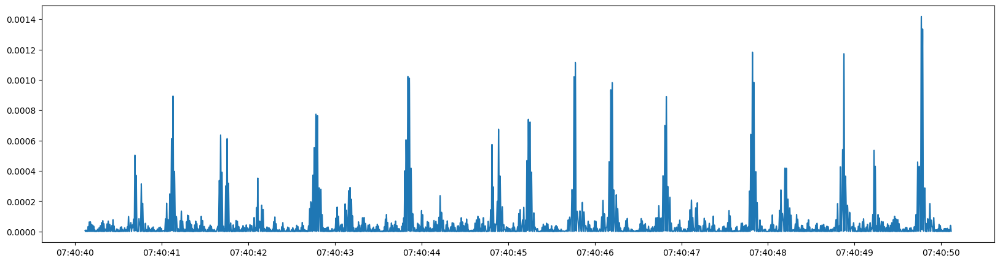

In [52]:
plt.figure(figsize=(20,5))
plt.plot(tm[4000000:4010000],shannon_energy(test_bp)[4000000:4010000])

In [28]:
csv = df['z']
csv = csv.to_frame()
csv.index = csv.index.values.astype(np.int64)

# csv = pd.DataFrame({'z':[csv['z'].diff()]})

In [30]:
df2 = pd.DataFrame({'z':[csv['z'].diff()]})

In [22]:

csv.index = csv.index.values.astype(np.int64)
csv = pd.DataFrame({'z':[csv['z'].diff()]})

In [35]:
df2 = pd.DataFrame({'z':[csv['z'].diff()]})

KeyError: 'z'

In [25]:
csv['z'].diff()

1679812440116000000         NaN
1679812440117000000    0.005918
1679812440118000000   -0.004286
1679812440119000000   -0.002041
1679812440120000000   -0.000408
                         ...   
1679830180965000000   -0.004898
1679830180966000000   -0.001633
1679830180967000000    0.004490
1679830180968000000    0.008163
1679830180969000000    0.000000
Name: z, Length: 17740854, dtype: float64

In [30]:
csv = pd.DataFrame({'z':[csv['z'].diff()]})


In [11]:
csv = df['z']
fs = 1e-09**-1/np.median(np.diff(csv.index.values.astype(np.int64)))
csv = pd.DataFrame(csv)


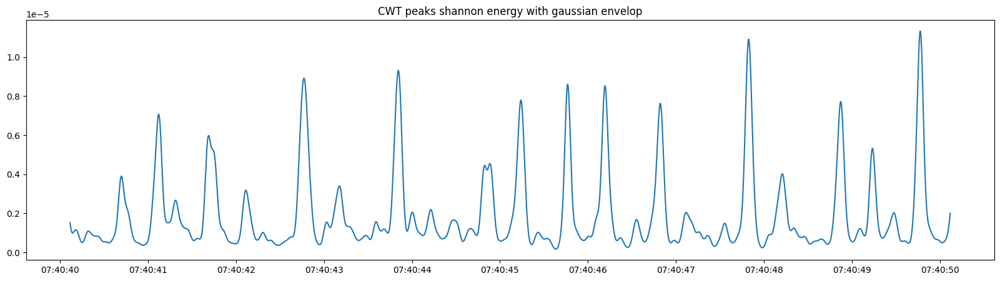

In [66]:
cwt_se = shannon_energy(cwt_pks)
cwt_se_gs = ndimage.gaussian_filter(np.abs(cwt_se),sigma=30)#40 is taken from the average heart sound lobe of 100ms 0.1*fs/4
plt.figure(figsize=(20,5))
plt.title('CWT peaks shannon energy with gaussian envelop')
plt.plot(tm[4000000:4010000],cwt_se_gs[4000000:4010000])


Text(0, 0.5, 'Z axis')

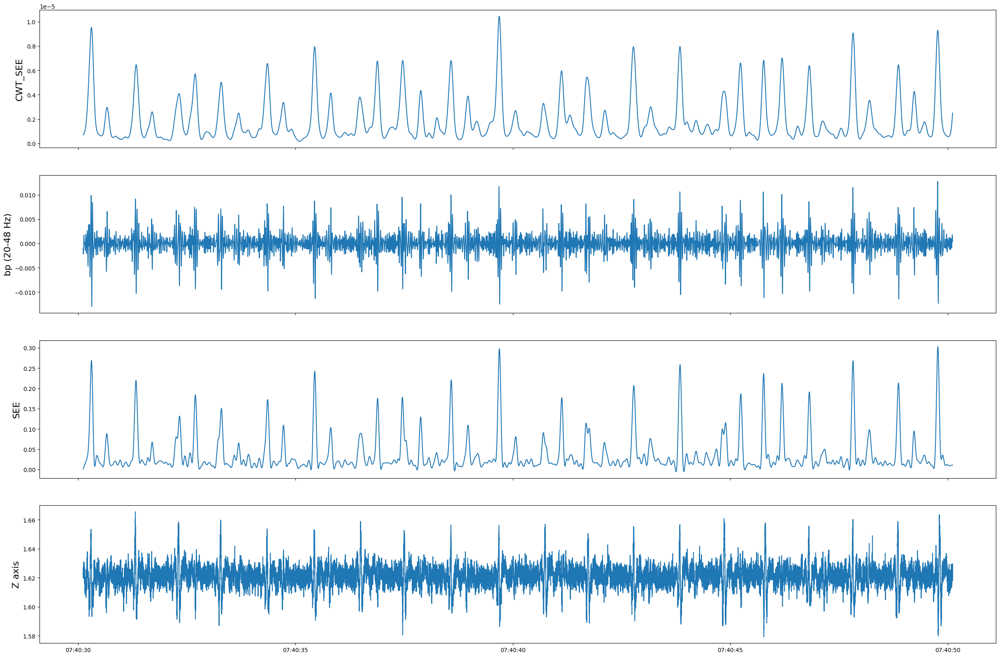

In [64]:
fig, axs = plt.subplots(4,sharex=True,figsize=(30,20))

axs[0].plot(tm[3990000:4010000],cwt_se_gs[3990000:4010000])
axs[0].set_ylabel('CWT_SEE',fontsize=16)
axs[1].plot(tm[3990000:4010000],test_bp[3990000:4010000])
axs[1].set_ylabel('bp (20-48 Hz)',fontsize=16)
axs[2].plot(tm[3990000:4010000],env_lp)
axs[2].set_ylabel('SEE',fontsize=16)
axs[3].plot(tm[3990000:4010000],csv[3990000:4010000])
axs[3].set_ylabel('Z axis',fontsize=16)


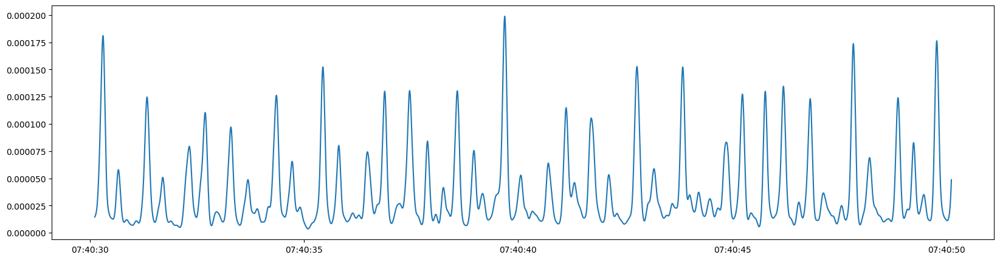

In [27]:
plt.figure(figsize=(20,5))
plt.plot(tm[3990000:4010000],cwt_se_gs[3990000:4010000])

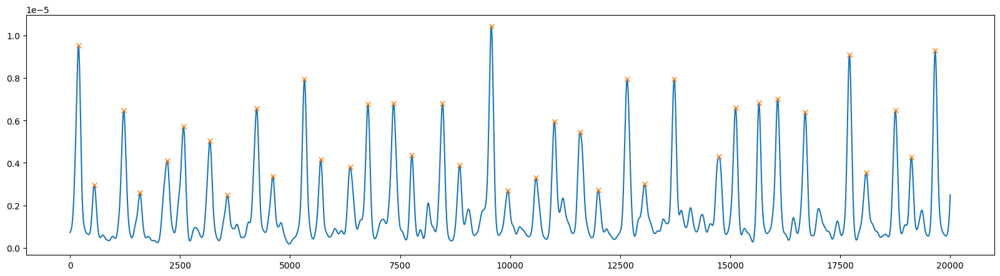

In [63]:
peaks, _ = signal.find_peaks(cwt_se_gs[3990000:4010000],height=0.2*10**-5,distance=350)
np.diff(peaks)
plt.figure(figsize=(20,5))
plt.plot(cwt_se_gs[3990000:4010000])
plt.plot(peaks, cwt_se_gs[3990000:4010000][peaks], "x")
plt.show()

In [30]:
test = csv[3990000:4010000]

In [ ]:
plt.imshow(cwtmtx[4000000:4010000],cmap="Blues")
plt.colorbar()

In [159]:
#CWT

params = cuf.load_defaults()
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(csv.index.values.astype(np.int64)))
csv = pd.DataFrame(csv)
test_bp = bandpass_filt(csv,(20,51),params['fs'],'bandpass')
test_bp = test_bp.to_numpy().flatten()
whole_cwtmtx = signal.cwt(test_bp,signal.morlet,np.arange(1,100))




In [ ]:
def shannon_energy(x):
    x_env = -x**2 * np.log(x**2)
    return(x_env)

In [81]:
tm = pd.to_datetime(csv.index)

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\matplotlib\cbook\__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


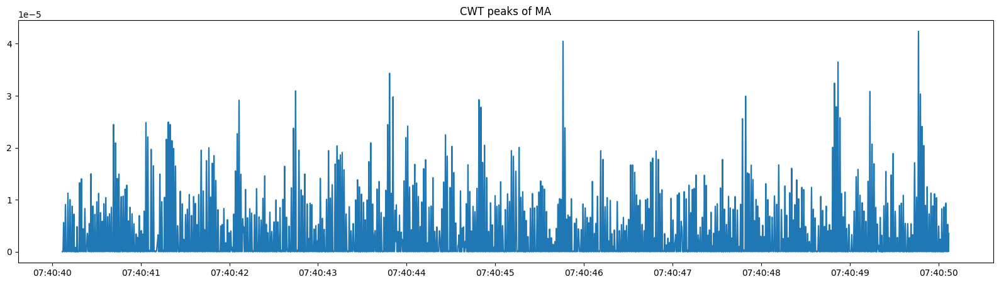

In [21]:
from scipy import ndimage
cwt_pk = cwtmtx.T[4000000:4010000,4:11]
cwt_pks = cwt_pk.max(axis=1)
# cwt_pk_ga = ndimage.gaussian_filter(cwt_pks,sigma=2)
plt.figure(figsize=(20,5))
plt.title('CWT peaks of MA')
plt.plot(tm[4000000:4010000],cwt_pks)

C:\Users\13103\AppData\Local\Temp\ipykernel_44300\763261200.py:15: ComplexWarning: Casting complex values to real discards the imaginary part
  LT[int(np.ceil(w_N/2)):-int(w_N/2)] = LTcumsum[w_N:] - LTcumsum[:-w_N]


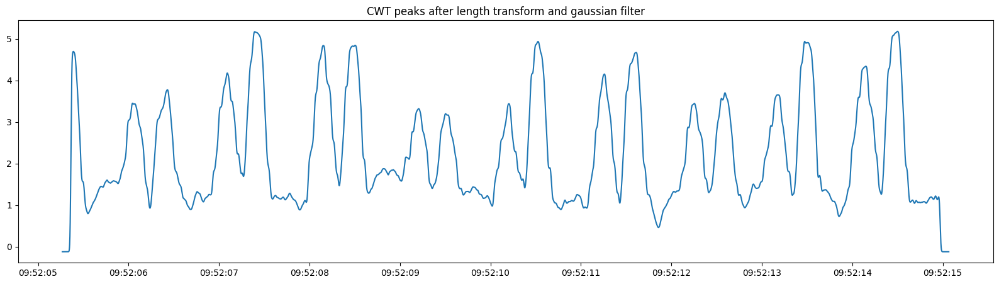

In [91]:
cwt_lt = lengthtransform(cwt_pks*1000)
cwt_lt_gs = ndimage.gaussian_filter(cwt_lt,sigma=8)
plt.figure(figsize=(20,5))
plt.title('CWT peaks after length transform and gaussian filter')
plt.plot(tm[200:10000],cwt_lt_gs)

In [94]:
def shannon_energy(x):
    x_env = -x**2 * np.log(x**2)
    return(x_env)

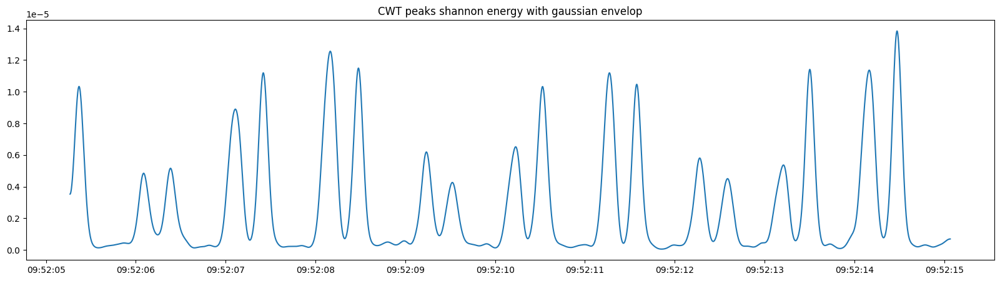

In [101]:
cwt_se = shannon_energy(cwt_pks)
cwt_se_gs = ndimage.gaussian_filter(np.abs(cwt_se),sigma=40)#40 is taken from the average heart sound lobe of 100ms 0.1*fs/4
plt.figure(figsize=(20,5))
plt.title('CWT peaks shannon energy with gaussian envelop')
plt.plot(tm[200:10000],cwt_se_gs)

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\matplotlib\cbook\__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'accel_z(-)')

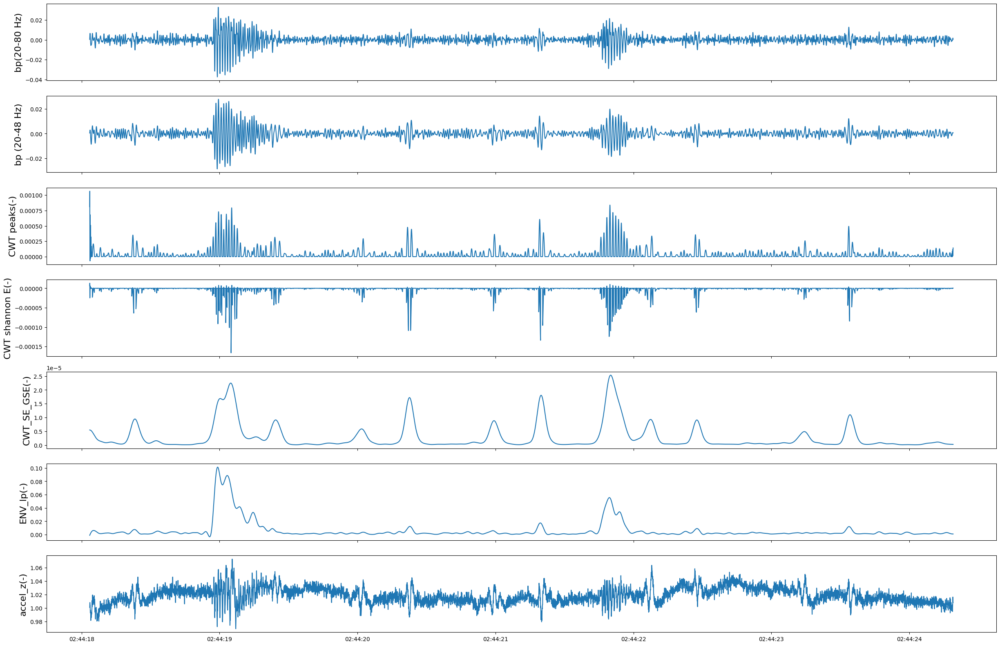

In [166]:
fig, axs = plt.subplots(7,sharex=True,figsize=(30,20))
time = pd.to_datetime(test.index, unit='ns')

axs[0].plot(time,bp['z'])
axs[0].set_ylabel('bp(20-80 Hz)',fontsize=16)
axs[1].plot(time,test_bp4['z'])
axs[1].set_ylabel('bp (20-48 Hz)',fontsize=16)
axs[2].plot(time,cwt_pks)
axs[2].set_ylabel('CWT peaks(-)',fontsize=16)
axs[3].plot(time,cwt_se)
axs[3].set_ylabel('CWT shannon E(-)',fontsize=16)
axs[4].plot(time,cwt_se_gs)
axs[4].set_ylabel('CWT_SE_GSE(-)',fontsize=16)
axs[5].plot(time,env_lp)
axs[5].set_ylabel('ENV_lp(-)',fontsize=16)
axs[6].plot(time,test['z'])
axs[6].set_ylabel('accel_z(-)',fontsize=16)

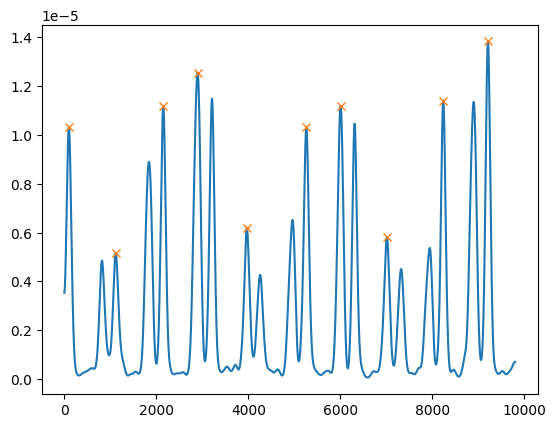

In [ ]:
peaks, _ = signal.find_peaks(cwt_se_gs,height=0.2*10**-5,distance=240)
np.diff(peaks)

plt.plot(cwt_se_gs)
plt.plot(peaks, cwt_se_gs[peaks], "x")
plt.show()

In [74]:
def lengthtransform(x,w=0.12,fs=1600):
    #LENGTHTRANSFORM Computes the length transform of signal <sig>
    # Length transform as described in Zong, Moody, Jiang (2003) A Robust
    # Open-source Algorithm to Detect Onset and Duration of QRS Complexes.
    # Length transform is simply the curve length with different windows <w>
    # resulting in output LT as a function of window length and sample
    C = 1/(fs**2)
    w_N = int(np.ceil(w*fs))
    normfactor = w_N/fs
    dy_k = np.array(np.diff(x,prepend=0))
    dL = np.sqrt(C + dy_k**2)
    
    LTcumsum = dL.cumsum()
    LT = np.zeros(len(dL))
    LT[int(np.ceil(w_N/2)):-int(w_N/2)] = LTcumsum[w_N:] - LTcumsum[:-w_N]
    return(LT-normfactor)

In [39]:
cwt_df = {'cwt_pk':(cwt_pks,index:=csv.index[:10000])} 

In [22]:
fofd = list()
k=0
for i in range(2,len(df)-2):
    
    v =(df['z'].iloc[i+1]-(df['z'].iloc[i-2]+df['z'].iloc[i-1]+df['z'].iloc[i]+df['z'].iloc[i+1]+df['z'].iloc[i+2])/5)/2
    fofd.append(v)
    
    if k == 100000:
        k=0
        print(pd.to_datetime(df.index[i]))
    else:
        k = k+1

2022-07-11 00:28:49.076891890
2022-07-11 00:29:51.652707606
2022-07-11 00:30:54.203285311
2022-07-11 00:31:56.753261510
2022-07-11 00:32:59.307779657
2022-07-11 00:34:01.876783324
2022-07-11 00:35:04.434104640
2022-07-11 00:36:06.989508926
2022-07-11 00:37:09.559279440
2022-07-11 00:38:12.131724889
2022-07-11 00:39:14.693846925
2022-07-11 00:40:17.261544605
2022-07-11 00:41:19.836786788
2022-07-11 00:42:22.407550424
2022-07-11 00:43:24.972927190
2022-07-11 00:44:27.539905845
2022-07-11 00:45:30.100215145
2022-07-11 00:46:32.652896498
2022-07-11 00:47:35.208389220
2022-07-11 00:48:37.769520149
2022-07-11 00:49:40.323734104
2022-07-11 00:50:42.890657178
2022-07-11 00:51:45.456449438
2022-07-11 00:52:48.010377319
2022-07-11 00:53:50.579160920
2022-07-11 00:54:53.145603850
2022-07-11 00:55:55.708032864
2022-07-11 00:56:58.262675788
2022-07-11 00:58:00.819690264
2022-07-11 00:59:03.383100
2022-07-11 01:00:05.941068880
2022-07-11 01:01:08.518039240
2022-07-11 01:02:11.087686956
2022-07-11 01

In [49]:
# use matrix to get moving average
def moving_average(data,r):
    mva = data
    for i in range(1,int(r/2+1)):
        mva = mva + data.tail(-i)+data.head(-i)
    mva = mva/r

In [50]:
mva = moving_average(df['z'],10)

KeyboardInterrupt: 

In [ ]:
fofd = df['z'][10:len(df['z'])-10]-mva

In [144]:
# Old MA
import polars as pl
import numpy as np
import pandas as pd
from scipy import signal
import io
f = open(r'C:\Users\13103\Documents\data_analysis\PSG\MA\test02-MA127-ma_v11-imu0-2022-07-10T16_00_00-0500-2022-07-15T06_30_00-0500.csv.gz','rb') 
df = pd.read_csv(io.BytesIO(f.read()),index_col='timestamp',compression='gzip')
df.index = pd.to_datetime(df.index).values.astype(np.int64)
df = df.tail(-40000)
df = df.rename(columns={'channel0': 'x', 'channel1': 'y','channel2': 'z'})
for i in ['x','y','z']:
    df[i]= df[i]/980


In [149]:
len(df)

63090717

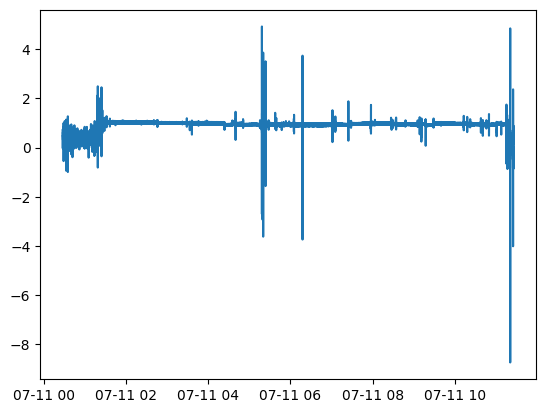

In [146]:
plt.plot(pd.to_datetime(df.index),df['z'])

In [86]:
import numpy as np
import pandas as pd
from scipy import signal
import io

import matplotlib.pyplot as plt

import multiprocessing as mp
from multiprocessing.shared_memory import SharedMemory
from tqdm import tqdm
import gc

import my_utils.common_utility_functions as cuf
import my_utils.ecg_functions as ecgfun
import my_utils.ma_functions as mafun
import my_utils.mwppg_functions as mwfun
import my_utils.plot_formatting as pf


params = cuf.load_defaults()
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(df.index.values.astype(np.int64)))
params['ma']['bandpass'] = (15,45)
z = df['z']
z = pd.DataFrame(z)
bp = cuf.zero_phase_filt(z,params['ma']['bandpass'],params['fs'],'bandpass')
env = np.abs(cuf.shannon_energy_env(bp))*np.sqrt(params['fs'])
env_lp = cuf.zero_phase_filt(env,params['ma']['envelope_lowpass'],params['fs'],'low')


lt = cuf.lengthtransform(bp,params['ma']['hs_length'])
lt_lp = cuf.zero_phase_filt(lt,params['ma']['envelope_lowpass'],params['fs'],'low')


In [90]:
params['ma']['envelope_lowpass']

10

In [10]:
def bandpass_filt(sig,cutoff,fs,mode):
    nyq = 0.5*fs
    wn = cutoff/nyq
    sos = signal.butter(4, wn, btype=mode,output='sos')
    
    return pd.DataFrame(data=signal.sosfiltfilt(sos,sig,axis=0),columns=sig.columns,index=sig.index)

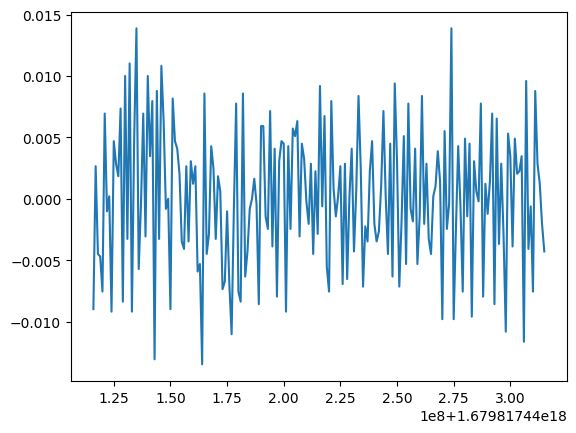

In [36]:
bandpass_filt(csv,(20,51),fs,'bandpass')

,z
1679812440116000000,NaN
1679812440117000000,NaN
1679812440118000000,NaN
1679812440119000000,NaN
1679812440120000000,NaN
...,...
1679830180965000000,NaN
1679830180966000000,NaN
1679830180967000000,NaN
1679830180968000000,NaN


In [6]:
z = test

In [34]:
params = cuf.load_defaults()
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(df.index.values.astype(np.int64)))
params['ma']['bandpass'] = (20,51)

In [10]:
bp = bandpass_filt(z,(3,20),params['fs'],'bandpass')
test_bp = bandpass_filt(z,(15,45),params['fs'],'bandpass')
test_bp2 = bandpass_filt(test_bp,(75,105),params['fs'],'bandpass')
test_bp3 = bandpass_filt(test_bp2,(135,165),params['fs'],'bandpass')

In [ ]:
z = df['z']

In [127]:
test = pd.DataFrame(test)

In [123]:
bp = bandpass_filt(test,(20,80),params['fs'],'bandpass')
# test_bp = bandpass_filt(test,(8,35),params['fs'],'bandpass')
test_bp4 = bandpass_filt(test,(18,51),params['fs'],'bandpass')

In [130]:
test_bp5 = bandpass_filt(test,(8,100),params['fs'],'bandpass')

In [4]:
test = df['z'][1150000:1160000]
test = pd.DataFrame(test)

C:\Users\13103\AppData\Local\Temp\ipykernel_53480\3922649558.py:1: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  test = df['z'][1150000:1160000]


In [72]:
import math

In [155]:
test = csv
test = pd.DataFrame(test)

In [121]:

test

pandas.core.frame.DataFrame

In [35]:
bp = bandpass_filt(test,(20,80),params['fs'],'bandpass')
# test_bp = bandpass_filt(test,(8,35),params['fs'],'bandpass')
test_bp4 = bandpass_filt(test,(18,51),params['fs'],'bandpass')
env = np.abs(cuf.shannon_energy_env(bp))*np.sqrt(params['fs'])
env_lp = cuf.zero_phase_filt(env,params['ma']['envelope_lowpass'],params['fs'],'low')


lt = cuf.lengthtransform(bp,params['ma']['hs_length'])
lt_lp = cuf.zero_phase_filt(lt,params['ma']['envelope_lowpass'],params['fs'],'low')


Text(0, 0.5, 'accel_z')

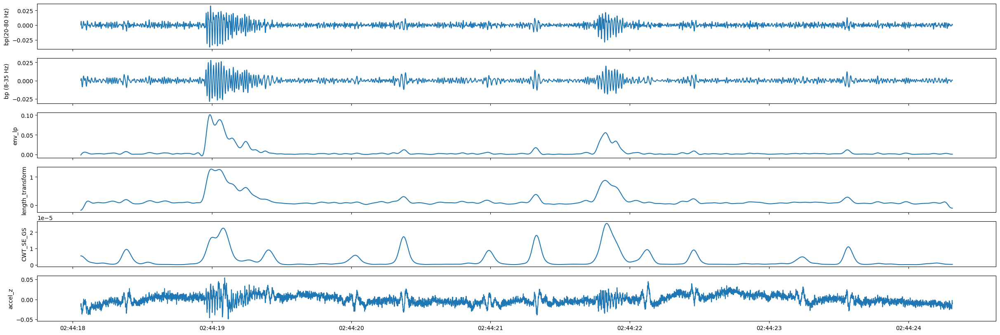

In [157]:
fig, axs = plt.subplots(6,sharex=True,figsize=(30,10))
time = pd.to_datetime(test.index, unit='ns')

axs[0].plot(time,bp['z'])
axs[0].set_ylabel('bp(20-80 Hz)')
axs[1].plot(time,test_bp4['z'])
axs[1].set_ylabel('bp (8-35 Hz)')
axs[2].plot(time,env_lp)
axs[2].set_ylabel('env_lp')
axs[3].plot(time,lt_lp)
axs[3].set_ylabel('length_transform')
axs[4].plot(time,cwt_se_gs)
axs[4].set_ylabel('CWT_SE_GS')
axs[5].plot(time,signal.detrend(test['z']))
axs[5].set_ylabel('accel_z')

In [ ]:
test_bp = bandpass_filt(csv,(20,51),params['fs'],'bandpass')

In [4]:
params = cuf.load_defaults()
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(csv.index.values.astype(np.int64)))

NameError: name 'csv' is not defined

In [5]:
#CWT

params = cuf.load_defaults()
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(csv.index.values.astype(np.int64)))
csv = pd.DataFrame(csv)
test_bp = bandpass_filt(csv,(20,51),params['fs'],'bandpass')
test_bp = test_bp.to_numpy().flatten()
cwtmtx = signal.cwt(test_bp,signal.morlet,np.arange(1,100))
cwt_pk = cwtmtx.T[:10000,20:51]
cwt_pk = cwt_pk.max(axis =1)
plt.plot(csv.index[:10000],cwt_pk)

NameError: name 'csv' is not defined

In [17]:
test_bp = test_bp.to_numpy().flatten()

In [18]:
cwtmtr = signal.cwt(test_bp,signal.morlet,np.arange(1,100))

In [17]:
cwt_pk = cwtmtx.T[:10000,20:51]

ValueError: x and y must have same first dimension, but have shapes (10000,) and (99,)

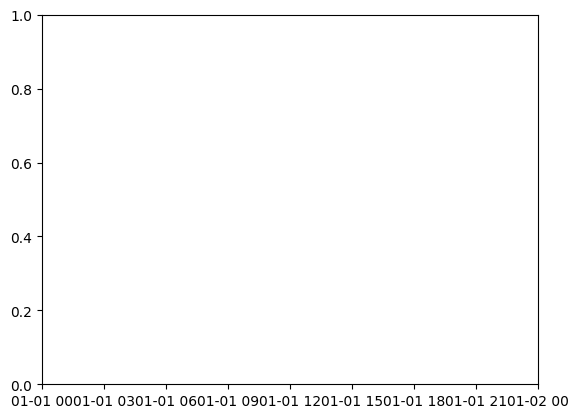

In [16]:
plt.plot(csv.index[:10000],cwt_pk.max(axis =1))

C:\Users\13103\AppData\Local\Temp\ipykernel_23904\3950643698.py:12: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  axs[4].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))


Text(0, 0.5, 'accel_z')

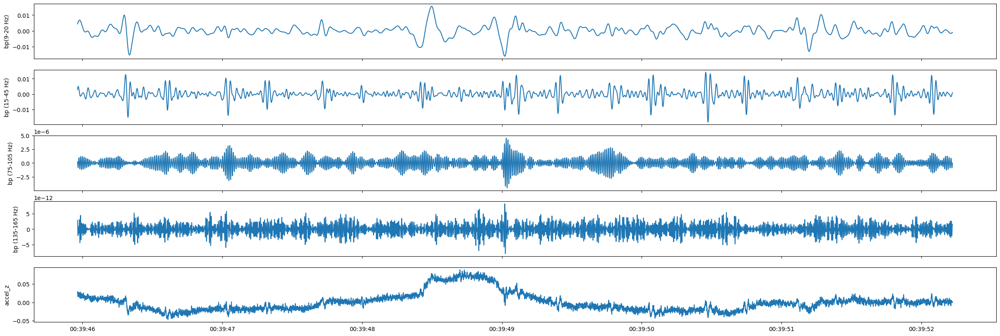

In [115]:
fig, axs = plt.subplots(5,sharex=True,figsize=(30,10))
time = pd.to_datetime(df.index, unit='ns')

axs[0].plot(time[1150000:1160000],bp[1150000:1160000])
axs[0].set_ylabel('bp(9-20 Hz)')
axs[1].plot(time[1150000:1160000],test_bp[1150000:1160000])
axs[1].set_ylabel('bp (15-45 Hz)')
axs[2].plot(time[1150000:1160000],test_bp2[1150000:1160000])
axs[2].set_ylabel('bp (75-105 Hz)')
axs[3].plot(time[1150000:1160000],test_bp3[1150000:1160000])
axs[3].set_ylabel("bp (135-165 Hz)")
axs[4].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))
axs[4].set_ylabel('accel_z')

C:\Users\13103\AppData\Local\Temp\ipykernel_23904\949540438.py:10: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  axs[3].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))


Text(0, 0.5, 'accel_z')

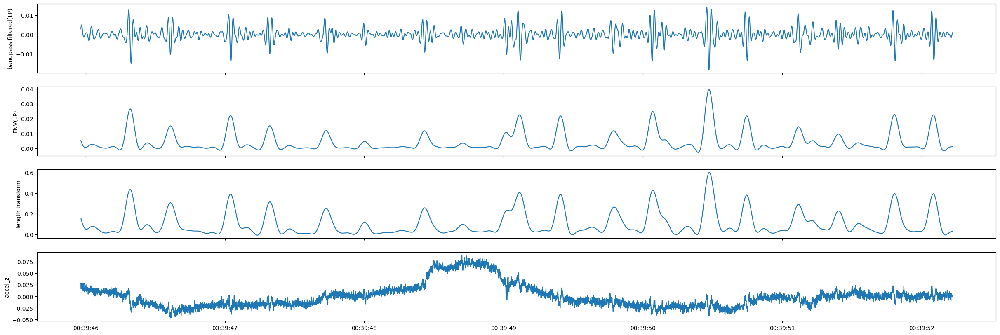

In [87]:
fig, axs = plt.subplots(4,sharex=True,figsize=(30,10))
time = pd.to_datetime(df.index, unit='ns')

axs[0].plot(time[1150000:1160000],bp[1150000:1160000])
axs[0].set_ylabel('bandpass filtered(LP)')
axs[1].plot(time[1150000:1160000],env_lp[1150000:1160000])
axs[1].set_ylabel('ENV(LP)')
axs[2].plot(time[1150000:1160000],lt_lp[1150000:1160000])
axs[2].set_ylabel("length transform")
axs[3].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))
axs[3].set_ylabel('accel_z')
# axs[2].plot(df['total'][18000:25000])

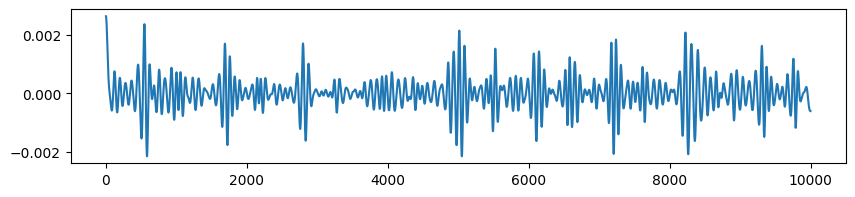

In [80]:
plt.figure(figsize=(10,2))
plt.plot(ndimage.gaussian_filter(bp[1150000:1160000],sigma = 20))

In [52]:
params['ma']['bandpass'] = (0.5,2)

In [29]:
fofd_bp = cuf.zero_phase_filt(fofd,params['ma']['bandpass'],params['fs'],'bandpass')

In [9]:
params['ma']['envelope_lowpass']

10

C:\Users\13103\AppData\Local\Temp\ipykernel_23904\331318830.py:8: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  axs[2].plot(time[100000:110000],signal.detrend(df['z'][100000:110000]))


Text(0, 0.5, 'accel_z')

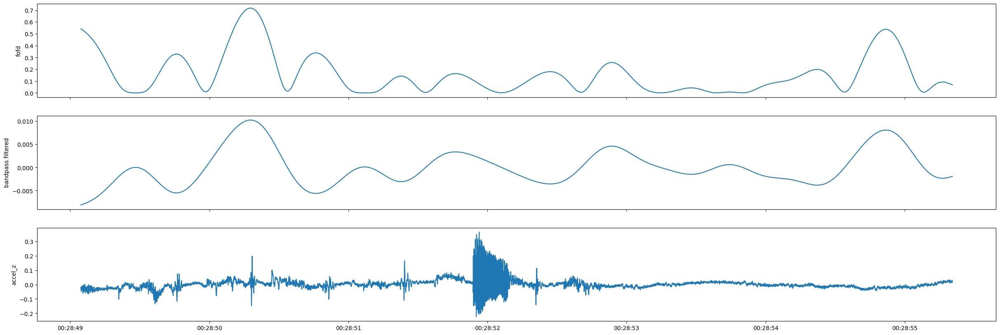

In [57]:
fig, axs = plt.subplots(3,sharex=True,figsize=(30,10))
time = pd.to_datetime(df.index, unit='ns')

axs[0].plot(time[100000:110000],lt_lp[100000:110000])
axs[0].set_ylabel('fofd')
axs[1].plot(time[100000:110000],bp[100000:110000])
axs[1].set_ylabel('bandpass filtered')
axs[2].plot(time[100000:110000],signal.detrend(df['z'][100000:110000]))
axs[2].set_ylabel('accel_z')
# axs[2].plot(df['total'][18000:25000])

C:\Users\13103\AppData\Local\Temp\ipykernel_23904\1808200664.py:10: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  axs[3].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))


Text(0, 0.5, 'accel_z')

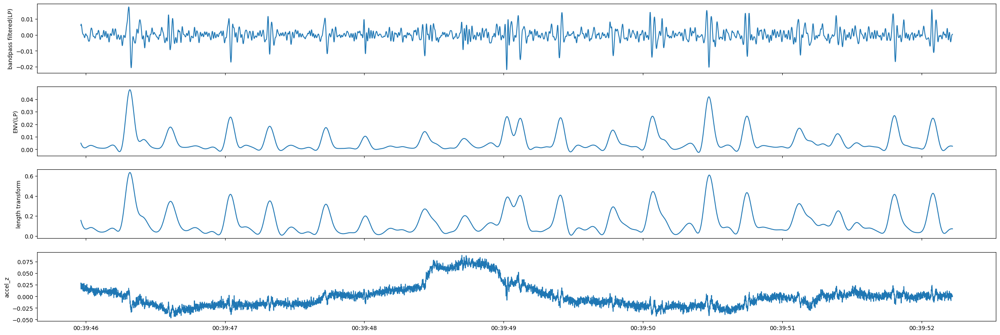

In [70]:
fig, axs = plt.subplots(4,sharex=True,figsize=(30,10))
time = pd.to_datetime(df.index, unit='ns')

axs[0].plot(time[1150000:1160000],bp[1150000:1160000])
axs[0].set_ylabel('bandpass filtered(LP)')
axs[1].plot(time[1150000:1160000],env_lp[1150000:1160000])
axs[1].set_ylabel('ENV(LP)')
axs[2].plot(time[1150000:1160000],lt_lp[1150000:1160000])
axs[2].set_ylabel("length transform")
axs[3].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))
axs[3].set_ylabel('accel_z')
# axs[2].plot(df['total'][18000:25000])



C:\Users\13103\AppData\Local\Temp\ipykernel_23904\3109479466.py:8: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  axs[2].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))


Text(0, 0.5, 'accel_z')

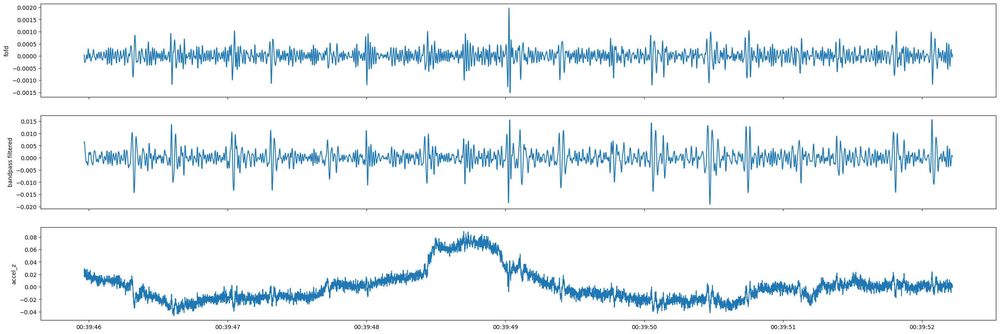

In [31]:
fig, axs = plt.subplots(3,sharex=True,figsize=(30,10))
time = pd.to_datetime(df.index, unit='ns')

axs[0].plot(time[1150000:1160000],fofd_bp[1150000:1160000])
axs[0].set_ylabel('fofd')
axs[1].plot(time[1150000:1160000],bp[1150000:1160000])
axs[1].set_ylabel('bandpass filtered')
axs[2].plot(time[1150000:1160000],signal.detrend(df['z'][1150000:1160000]))
axs[2].set_ylabel('accel_z')
# axs[2].plot(df['total'][18000:25000])

In [3]:
acc_df = ma_df[['x','y','z']]*1000
acc_df.index =  acc_df.index.astype(np.int64)

In [63]:
ma_df.index = ma_df.index.astype(np.int64)

In [27]:
import numpy as np
import pandas as pd
from scipy import signal
import io

import matplotlib.pyplot as plt

import multiprocessing as mp
from multiprocessing.shared_memory import SharedMemory
from tqdm import tqdm
import gc

import my_utils.common_utility_functions as cuf
import my_utils.ecg_functions as ecgfun
import my_utils.ma_functions as mafun
import my_utils.mwppg_functions as mwfun
import my_utils.plot_formatting as pf

verbose=False
t0 = df.index.values[0]

# specified parameters for analysis
full_delineation = False

# load default params
params = cuf.load_defaults()
params['ma']['bandpass'] = (20,51)
# pre-calculate and update parameters
params['fs'] = params['units']**-1/np.median(np.diff(df.index.values.astype(np.int64)))
# params['fs'] = 1600

# Analysis
RR_waveforms = list()
# VITALS = pd.DataFrame()
if ('z' in df.columns):
        print("in ma")
        if verbose: print('Calculating Accel...')
        ma = acc_df[['x','y','z']].dropna()
        # Heart Sounds
        if ('ecg' in df.columns):
            # Use ECG as fiducial
            pks_ecg_ovlp = np.intersect1d(pks_ecg,ma.index)
            pks_ecg_ind = ma.index.get_indexer(pks_ecg_ovlp)
            ma_pks = mafun.hs_pks_ecg_ridgefinding(ma['z'].values,pks_ecg_ind,params)
            pks_s1, pks_s2, pks_ao, pks_ac = [ma.index.values[pks] for pks in ma_pks]
            
            MA = pd.DataFrame(data={'PEP_env':(pks_s1-qrs_onset)*params['units'],'LVET_env':(pks_s2-pks_s1)*params['units'],'PEP_av':(pks_ao-qrs_onset)*params['units'],'LVET_av':(pks_ac-pks_ao)*params['units']},index=pks_ecg_ovlp)
        else:
            # MA-only Code
            print(params['fs'])
            pks_beats, pks_s1, pks_s2 = mafun.hs_pks(ma['z'].values,params)
            pks_beats, pks_s1, pks_s2 = ma.index.values[pks_beats], ma.index.values[pks_s1], ma.index.values[pks_s2]
            
            pks_ma_hr = pks_beats # which peaks to use for HR (most consistent)
            hr_ma = 60/np.diff(pks_ma_hr,append=(pks_ma_hr[-1]+(pks_ma_hr[-1]-pks_ma_hr[-2])))/params['units']
            #hr_ma = mafun.hr_clean(hr_ma,beats_in_window=60)
            #hr_ma = cuf.rm_spike(hr_ma)
            # hr_ma[(hr_ma<params['hr_bounds'][0])|(hr_ma>params['hr_bounds'][1])] = np.nan
            hrv_ma = cuf.HRV_rmssd(pks_ma_hr,n_beats=30,drop_thresh=.1/params['units'])*params['units']
            hrv_ma.index = hrv_ma.index.astype(np.int64)
            MA = pd.DataFrame(data={'HR_MA':hr_ma},index=pks_ma_hr)
            MA = pd.merge_asof(MA,hrv_ma,left_index=True,right_index=True)
            MA = pd.merge_asof(MA,pd.DataFrame(data={'LVET':(pks_s2-pks_s1)*params['units']},index=pks_s1),left_index=True,right_index=True)

        VITALS = MA    
        # VITALS = pd.merge_asof(VITALS,MA,left_index=True,right_index=True,tolerance=int(1/params['units'])) if 'VITALS' in locals() else MA
        
        # Chest Rotation / Body Orientation / Physical Activity
        a,ds_factor = cuf.downsample_stages_df(ma,original=params['fs'],target=params['ma']['downsample_fs'])
        VITALS = pd.merge_asof(VITALS,mafun.calculate_activity(np.sqrt(a['x']**2 + a['y']**2 + a['z']**2) ,params['fs']/ds_factor,params),left_index=True,right_index=True)

        chest_rotation, dominant_g = mafun.resp_orient(a.values.T,params['fs']/ds_factor)
        RR_waveforms.append(pd.DataFrame(data={'chest_rotation':chest_rotation},index=a.index))
        VITALS = pd.merge_asof(VITALS,pd.DataFrame(data={'orient_x':dominant_g[0,:],'orient_y':dominant_g[1,:],'orient_z':dominant_g[2,:]},index=a.index),left_index=True,right_index=True)


in ma
999.9999999999999


c:\Users\13103\Documents\data_analysis\PSG\ecg-scg-ppg-analysis-dev\ecg-scg-ppg-analysis-dev\my_utils\ma_functions.py:264: RuntimeWarning: invalid value encountered in divide
  r_t_norm = r_t_norm/np.sqrt(r_t_norm[0,:]**2+r_t_norm[1,:]**2+r_t_norm[2,:]**2)


In [65]:
params['ma']['bandpass'] = (20,50)

In [73]:
def hs_pks(z,params,segment_hs=False):
    """finds heart sounds on MA signal alone and attempts to identify s1 and s2"""

    # Filtering
    bp = cuf.zero_phase_filt(z,params['ma']['bandpass'],params['fs'],'bandpass')
    env = np.abs(cuf.shannon_energy_env(bp))*np.sqrt(params['fs'])
    env_lp = cuf.zero_phase_filt(env,params['ma']['envelope_lowpass'],params['fs'],'low')

    lt = cuf.lengthtransform(bp,params['ma']['hs_length'])
    lt_lp = cuf.zero_phase_filt(lt,params['ma']['envelope_lowpass'],params['fs'],'low')

    # Get HR
    pks_beats,pks_hs = get_periodic_beats(env_lp,lt_lp,params)

    if pks_hs.size > 3:
        # Detect both heart sounds
        s1_candidates = np.pad(np.diff(np.diff(pks_hs))<0*params['fs'],pad_width=(1,1))
        s2_candidates = np.pad(np.diff(np.diff(pks_hs))>0*params['fs'],pad_width=(1,1))

        pks_s1 = pks_hs[s1_candidates]
        pks_s2 = pks_hs[s2_candidates]
        if np.median(env_lp[pks_s1]) >= np.median(env_lp[pks_s2]):
            pks_s2 = force_alternate(fiducials=pks_s1,forced_array=pks_s2,function=env_lp)
            pks_s1 = pks_s1[:-1]
        else:
            pks_s1 = force_alternate(fiducials=pks_s2,forced_array=pks_s1,function=env_lp)
            pks_s2 = pks_s2[1:]
        idx_nans = (np.isnan(pks_s1) | np.isnan(pks_s2))
    
        return pks_beats, pks_s1[~idx_nans].astype(int), pks_s2[~idx_nans].astype(int)
    else:
        return pks_beats, np.array(None), np.array(None)


In [153]:
filtered_vt = VITALS[VITALS['HR_MA']<120]

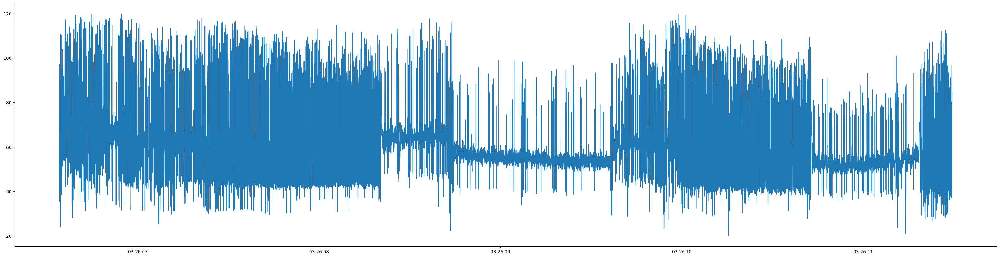

In [143]:
plt.figure(figsize=(40,10))
tm = pd.to_datetime(filtered_vt.index)

plt.plot(tm,filtered_vt['HR_MA'])

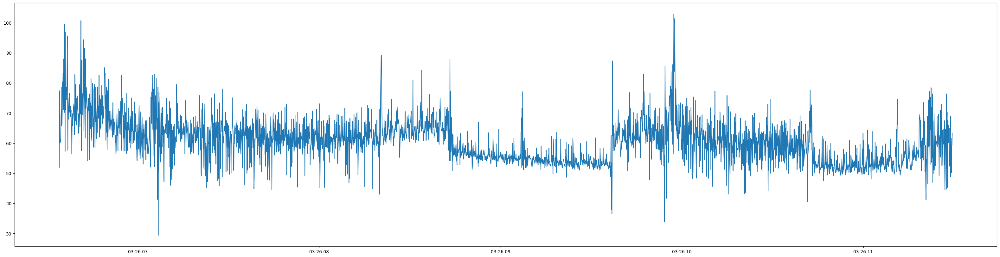

In [149]:
plt.figure(figsize=(40,10))
plt.plot(hr_a)

In [147]:
tt = filtered_vt['HR_MA']
tt = tt.resample()

AttributeError: 'DatetimeIndexResampler' object has no attribute 'index'

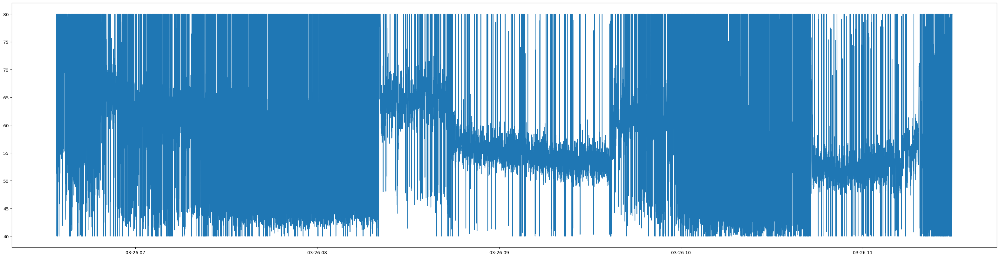

In [77]:
plt.figure(figsize=(40,10))
tm = pd.to_datetime(VITALS.index)
filtered_vt = VITALS['HR_MA']<80
plt.plot(tm,VITALS['HR_MA'].clip(40,80))

In [15]:
params['ma']['window']*params['fs']

29999.999999999996

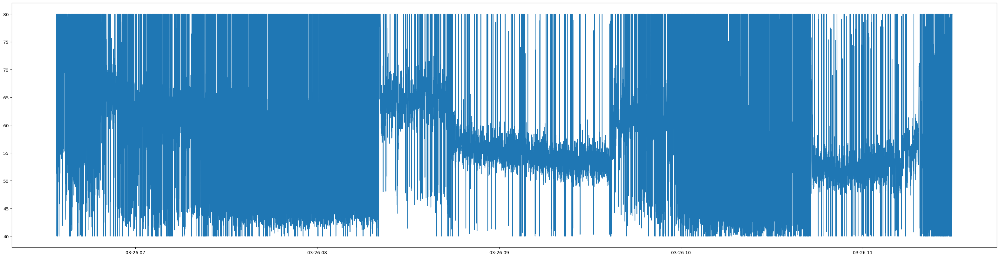

In [27]:
plt.figure(figsize=(40,10))
tm = pd.to_datetime(VITALS.index)
filtered_vt = VITALS['HR_MA']<80
plt.plot(tm,VITALS['HR_MA'].clip(40,80))

In [ ]:
params['fs'] = params['units']**-1/np.median(np.diff(df.index.values.astype(np.int64)))

In [7]:
import mne
import matplotlib.pyplot as plt 
import pandas as pd   
import io
import numpy as np
file = r"C:\Users\13103\Downloads\002.edf"
data = mne.io.read_raw_edf(file)
edf_df =  data.to_data_frame()
# raw_data = data.get_data()
# you can get the metadata included in the file and a list of all channels:
info = data.info
channels = data.ch_names

Extracting EDF parameters from C:\Users\13103\Downloads\002.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\13103\AppData\Local\Temp\ipykernel_19428\2505940994.py:7: RuntimeWarning: Omitted 31 annotation(s) that were outside data range.
  data = mne.io.read_raw_edf(file)
C:\Users\13103\AppData\Local\Temp\ipykernel_19428\2505940994.py:7: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  data = mne.io.read_raw_edf(file)


In [9]:
def read_edf(path, start_time):
    df = mne.io.read_raw_edf(path).to_data_frame()
    df['time'] = pd.to_timedelta(df['time'], unit='s') + start_time
    df.set_index('time', inplace=True)
    df = df['PR']
    df_resampled = df.resample('1ms').asfreq()
    df_upsampled = df_resampled.interpolate(method='linear')
    
    ret = pd.DataFrame()
    ret['hr'] = df_upsampled.values*10e-7
    ret.set_index(df_upsampled.index.values, inplace=True)

    return ret

In [12]:
import datetime 

In [13]:
start_time = datetime.datetime(2023, 4, 18, 22, 59, 38)
edf_df = read_edf(r"C:\Users\13103\Documents\data_analysis\PSG\rawdata\yd005.edf", start_time)

Extracting EDF parameters from C:\Users\13103\Documents\data_analysis\PSG\rawdata\yd005.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\13103\AppData\Local\Temp\ipykernel_19428\3011334868.py:2: RuntimeWarning: Omitted 1 annotation(s) that were outside data range.
  df = mne.io.read_raw_edf(path).to_data_frame()
C:\Users\13103\AppData\Local\Temp\ipykernel_19428\3011334868.py:2: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  df = mne.io.read_raw_edf(path).to_data_frame()


In [ ]:
hr.index = pd.to_datetime(pd.to_datetime(hr.index,unit = 's'))

In [19]:
hr = edf_df['hr']
hr = hr.to_frame()

hr = hr.clip(40,100)
plt.figure(figsize=(20,4))
plt.plot(VITALS['HR_MA'])
plt.plot(hr)

Error in callback <function _draw_all_if_interactive at 0x0000018D80E80670> (for post_execute):


OverflowError: int too big to convert

OverflowError: int too big to convert

<Figure size 2000x400 with 1 Axes>

In [20]:
VITALS.index = pd.to_datetime(VITALS.index)

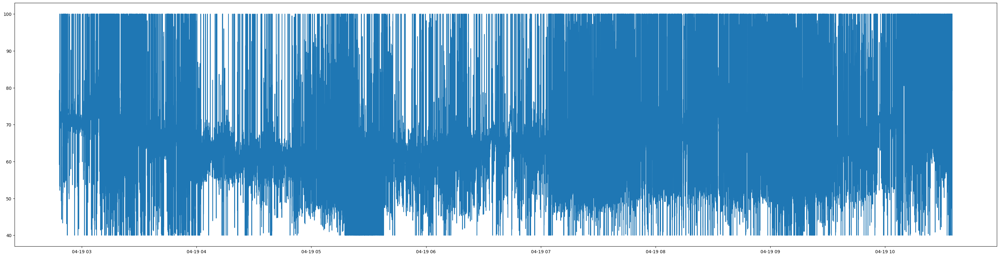

In [28]:
plt.figure(figsize=(40,10))
tm = pd.to_datetime(VITALS.index)
filtered_vt = VITALS['HR_MA']<120
plt.plot(tm,VITALS['HR_MA'].clip(40,100))

In [43]:
ad_hr = bandpass_filt(VITALS['HR_MA'].to_frame(),0.05,1,'lowpass')

In [ ]:
tm = pd.to_datetime(VITALS.index)

In [48]:
from datetime import timedelta

In [50]:
tm = tm-timedelta(hours=5)

C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\13103\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


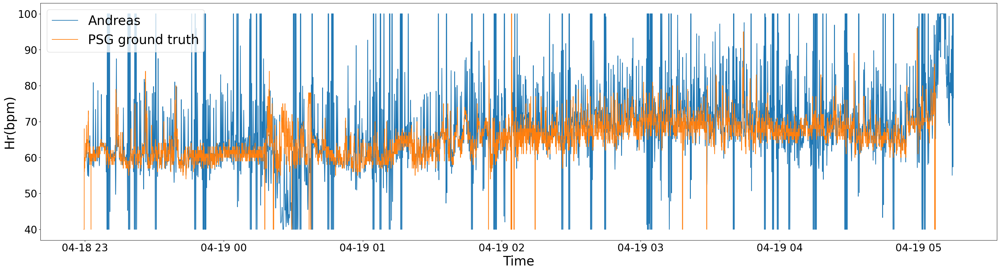

In [58]:
plt.figure(figsize=(40,10))
plt.plot(tm[5000:29000],ad_hr.clip(40,100)[5000:29000],label='Andreas')
plt.plot(hr,label='PSG ground truth')
plt.xlabel('Time',fontsize = 30)
plt.xticks(fontsize = 24)
plt.ylabel('Hr(bpm)',fontsize = 30)
plt.yticks(fontsize = 24)
plt.legend(fontsize = 30)

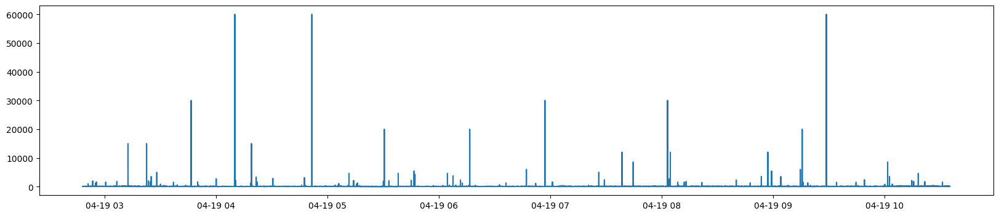

In [22]:

plt.figure(figsize=(20,4))
plt.plot(VITALS['HR_MA'])
# plt.plot(hr)